# Tutorial - basic pymgrid functions

In this notebook, we are going to over some basic pymgrid functions and show you how you can create your first microgrid.

In [1]:
from __future__ import division

import sys
sys.path.append('C:/Users/Tanguy LEVENT/Documents/Ploutos/Projet_Ploutos/pymgrid/')
from pymgrid import MicrogridGenerator as mg

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

ModuleNotFoundError: No module named 'plotly'

## 1. Using MicrogridGenerator

When creating a MicrogridGenerator object,
you can pass it the number of microgrid you want to generate through nb_microgrid. In this example we are generating 10 microgrids.

In [3]:
m_gen=mg.MicrogridGenerator(nb_microgrid=100)
m_gen.generate_microgrid()

,load,cost_loss_load,cost_overgeneration,PV_rated_power,battery_soc_0,battery_power_charge,battery_power_discharge,battery_capacity,battery_efficiency,battery_soc_min,battery_soc_max,battery_cost_cycle,grid_weak,grid_power_import,grid_power_export,genset_polynom_order,genset_polynom_0,genset_polynom_1,genset_polynom_2,genset_rated_power,genset_pmin,genset_pmax,fuel_cost
0,960,10,1,969.60,0.200000,363,363,1452,0.9,0.2,1,0.3,0.0,1920.0,1920.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,44231,10,1,22557.81,0.200000,16721,16721,66881,0.9,0.2,1,0.3,1.0,88462.0,88462.0,3.0,3.088609,0.658855,0.056644,49146.0,0.2,0.9,0.4
2,1752,10,1,1121.28,0.200000,1597,1597,6386,0.9,0.2,1,0.3,0.0,3504.0,3504.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,99955,10,1,60972.55,0.200000,59593,59593,238372,0.9,0.2,1,0.3,1.0,199910.0,199910.0,3.0,8.293175,0.540997,0.052782,111062.0,0.2,0.9,0.4
4,6221,10,1,2675.03,0.634805,3204,3204,12816,0.9,0.2,1,0.3,1.0,12442.0,12442.0,3.0,0.539511,0.520774,0.081661,6913.0,0.2,0.9,0.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,68201,10,1,38874.57,1.000000,35125,35125,140500,0.9,0.2,1,0.3,NaN,NaN,NaN,3.0,3.025492,0.265997,0.052910,75779.0,0.2,0.9,0.4
96,84733,10,1,39824.51,0.200000,34714,34714,138855,0.9,0.2,1,0.3,0.0,169466.0,169466.0,3.0,1.156093,0.501758,0.025340,94148.0,0.2,0.9,0.4
97,76047,10,1,31939.74,0.200000,56674,56674,226695,0.9,0.2,1,0.3,0.0,152094.0,152094.0,3.0,1.186642,0.763910,0.090892,84497.0,0.2,0.9,0.4
98,37678,10,1,53502.76,0.200000,22464,22464,89854,0.9,0.2,1,0.3,NaN,NaN,NaN,3.0,3.439020,0.061654,0.000348,41865.0,0.2,0.9,0.4


You can access any of the microgrids generated through the "microgrids" list contained in the MicrogridGenerator object. Print info allows you to print important information about the microgrid.

In [4]:
m_gen.microgrids[0].print_info()

Microgrid parameters


,load,cost_loss_load,cost_overgeneration,PV_rated_power,battery_soc_0,battery_power_charge,battery_power_discharge,battery_capacity,battery_efficiency,battery_soc_min,battery_soc_max,battery_cost_cycle,grid_weak,grid_power_import,grid_power_export
0,960,10,1,969.6,0.2,363,363,1452,0.9,0.2,1,0.3,0,1920,1920


Architecture:
{'PV': 1, 'battery': 1, 'genset': 0, 'grid': 1}
Actions: 
Index(['pv_consummed', 'battery_charge', 'battery_discharge', 'grid_import',
       'grid_export'],
      dtype='object')
Control dictionnary:
['pv_consummed', 'battery_charge', 'battery_discharge', 'grid_import', 'grid_export']
Status: 
Index(['load', 'hour', 'pv', 'battery_soc', 'capa_to_charge',
       'capa_to_discharge', 'grid_status', 'grid_price_import',
       'grid_price_export'],
      dtype='object')
Has run mpc baseline:
False
Has run rule based baseline:
False


## 2. Using Microgrid

You can use the class microgrid to run your simulation. You can access it through the microgrids list in MicrogridGenerator. 

We are going to create a new variable 'mg' that will contain a microgrid.

In [5]:
mg = m_gen.microgrids[0]
mg.print_info()

Microgrid parameters


,load,cost_loss_load,cost_overgeneration,PV_rated_power,battery_soc_0,battery_power_charge,battery_power_discharge,battery_capacity,battery_efficiency,battery_soc_min,battery_soc_max,battery_cost_cycle,grid_weak,grid_power_import,grid_power_export
0,960,10,1,969.6,0.2,363,363,1452,0.9,0.2,1,0.3,0,1920,1920


Architecture:
{'PV': 1, 'battery': 1, 'genset': 0, 'grid': 1}
Actions: 
Index(['pv_consummed', 'battery_charge', 'battery_discharge', 'grid_import',
       'grid_export'],
      dtype='object')
Control dictionnary:
['pv_consummed', 'battery_charge', 'battery_discharge', 'grid_import', 'grid_export']
Status: 
Index(['load', 'hour', 'pv', 'battery_soc', 'capa_to_charge',
       'capa_to_discharge', 'grid_status', 'grid_price_import',
       'grid_price_export'],
      dtype='object')
Has run mpc baseline:
False
Has run rule based baseline:
False


An important note: the control dictionnary argument are the values to be filled to control the microgrid.

In [6]:
mg.print_control_info()

you should fill this dictionnary at each time step
it is included in the mg_data object
you can copy it by: ctrl = mg_data.control_dict
or you can use self.get_conrol_dict()
Control dictionnary:
['pv_consummed', 'battery_charge', 'battery_discharge', 'grid_import', 'grid_export']


For convenience, most informations about the different values and parameters in the pymigrid can be easily accessed as follow:

In [7]:
mg.load

304.403798960378

In [7]:
mg.pv

0.0

In [8]:
mg.battery.

0.2

There are a few visualization functions that have been implemented to print some of the microgrid data. print_load_pv() plots the PV and load profiles in plotly figures that are interactive.

In [8]:
mg.print_load_pv()

Load


PV


Now we can run our microgrid with simple actions.

the variable done is used when running a simulation, it will turn to True once you reach the end of load and pv timeseries

We run the microgrid over 20 time steps
Example here on how you can fill the control dict to run the microgrid

the function get_state() allows you to recover the data you need to make control decisions
it will contain 'state' that are attributes of the microgrid changing with time (net_load, battery state of charge etc..)
the load from the current time step to the horizon'th timestep, same for pv and grid
it also return the parameters of the microgrid that are not varying with time (like capacity of battery or rated power of the generator)


{'load': 372.1028046220474, 'hour': 23.0, 'pv': 0.0, 'battery_soc': 0.2, 'capa_to_charge': 1256.0, 'capa_to_discharge': 0.0, 'grid_status': 1.0, 'grid_price_import': 0.22, 'grid_price_export': 0.0}
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 372.1028046220474, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          372.102805
grid_export            0.000000
load                 372.102805
pv                     0.000000
Name: 24, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 323.3375569718403, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          277.005125
grid_export            0.000000
load                 277.005125
pv                     0.000000
Name: 50, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 302.32274902131365, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          302.322749
grid_export            0.000000
load                 302.322749
pv                     0.000000
Name: 51, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 302.32274902131365, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load     

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          389.350379
grid_export            0.000000
load                 389.350379
pv                     0.000000
Name: 71, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 314.27804149252034, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          314.278041
grid_export            0.000000
load                 314.278041
pv                     0.000000
Name: 72, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 280.63619343003575, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load     

Name: 89, dtype: float64
cost:  106.5481
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 5.320627115759322, 'grid_import': 853.5904306220094, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      5.320627
grid_import          853.590431
grid_export            0.000000
load                 858.911058
pv                     0.000000
Name: 90, dtype: float64
cost:  1.6802881347277967
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 858.9110577377687, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          858.911058
grid_export            0.000000
load                 858.911058
pv                

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          757.068669
grid_export            0.000000
load                 757.068669
pv                     0.000000
Name: 113, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 858.9110577377687, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          858.911058
grid_export            0.000000
load                 858.911058
pv                     0.000000
Name: 114, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 858.9110577377687, 'grid_export': 0, 'pv_consummed': 0.0}
l

loss_load              0.000000
overgeneration         0.000000
pv_consummed         337.920000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          154.634419
grid_export            0.000000
load                 492.554419
pv                   337.920000
Name: 134, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         522.240000
pv_curtailed           0.000000
battery_charge         3.160627
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 519.079373
pv                   522.240000
Name: 135, dtype: float64
cost:  1.2962881347277975
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 2.5601079637650743, 'grid_import': 485.7992649204757, 'grid_export': 0, 'pv_consummed': 30.720000000000006}
loss_load              0.000000
overgeneration         0.000000
pv_consummed

loss_load              0.000000
overgeneration         0.000000
pv_consummed         307.200000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    124.354412
grid_import           99.471175
grid_export            0.000000
load                 531.025588
pv                   307.200000
Name: 157, dtype: float64
cost:  37.65442369461202
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 5.1159076974727215e-14, 'grid_import': 93.19441874539012, 'grid_export': 0, 'pv_consummed': 399.36000000000007}
loss_load            0.000000e+00
overgeneration       0.000000e+00
pv_consummed         3.993600e+02
pv_curtailed         0.000000e+00
battery_charge       0.000000e+00
battery_discharge    5.115908e-14
grid_import          9.319442e+01
grid_export          0.000000e+00
load                 4.925544e+02
pv                   3.993600e+02
Name: 158, dtype: float64
cost:  0.3481000000000153
penalty:  0.0
loss_load              0.000000
overgeneration        

Name: 180, dtype: float64
cost:  15.360766527980003
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         875.520000
pv_curtailed           0.000000
battery_charge        26.757778
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 848.762222
pv                   875.520000
Name: 181, dtype: float64
cost:  8.375433472019985
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         768.000000
pv_curtailed           0.000000
battery_charge       125.228285
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 642.771715
pv                   768.000000
Name: 182, dtype: float64
cost:  37.91658535279993
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 180.63787885091813, 'grid_import': 0, 'grid_export': 0, 'pv_consummed': 445.44000000000005}
loss_load              0.0000

loss_load              0.00000
overgeneration         0.00000
pv_consummed         614.40000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          154.31532
grid_export            0.00000
load                 768.71532
pv                   614.40000
Name: 201, dtype: float64
cost:  0.0841
penalty:  0.0
loss_load              0.00000
overgeneration         0.00000
pv_consummed         798.72000
pv_curtailed           0.00000
battery_charge        30.00468
battery_discharge      0.00000
grid_import            0.00000
grid_export            0.00000
load                 768.71532
pv                   798.72000
Name: 202, dtype: float64
cost:  9.085503861792493
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 24.303790426839704, 'grid_import': 75.53620957316011, 'grid_export': 0, 'pv_consummed': 860.1600000000002}
loss_load              0.00000
overgeneration         0.00000
pv_consummed         860.16000
pv_curtailed      

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          577.221854
grid_export            0.000000
load                 577.221854
pv                     0.000000
Name: 222, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 577.2218544925015, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          577.221854
grid_export            0.000000
load                 577.221854
pv                     0.000000
Name: 223, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 103.9678710970743, 'grid_export': 0, 'pv_consummed': 445.44000000000005}

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          277.005125
grid_export            0.000000
load                 277.005125
pv                     0.000000
Name: 242, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 302.32274902131365, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          302.322749
grid_export            0.000000
load                 302.322749
pv                     0.000000
Name: 243, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 302.32274902131365, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load   

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          280.636193
grid_export            0.000000
load                 280.636193
pv                     0.000000
Name: 265, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 277.005125101651, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          277.005125
grid_export            0.000000
load                 277.005125
pv                     0.000000
Name: 266, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 302.32274902131365, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load     

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          660.373319
grid_export            0.000000
load                 660.373319
pv                     0.000000
Name: 285, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 660.3733192125121, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          660.373319
grid_export            0.000000
load                 660.373319
pv                     0.000000
Name: 286, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 389.3503791818749, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load     

loss_load              0.000000
overgeneration         0.000000
pv_consummed         307.200000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    211.879373
grid_import            0.000000
grid_export            0.000000
load                 519.079373
pv                   307.200000
Name: 304, dtype: float64
cost:  63.911911865272224
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 403.0686687973978, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    354.000000
grid_import          403.068669
grid_export            0.000000
load                 757.068669
pv                     0.000000
Name: 305, dtype: float64
cost:  106.5481
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 504.9110577377687, 'grid_export': 0, 'pv_consummed': 0

loss_load              0.000000
overgeneration         0.000000
pv_consummed         230.400000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          301.996316
grid_export            0.000000
load                 532.396316
pv                   230.400000
Name: 321, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 271.27631597859175, 'grid_export': 0, 'pv_consummed': 261.12000000000006}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         261.120000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          271.276316
grid_export            0.000000
load                 532.396316
pv                   261.120000
Name: 322, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 50.29044159086175, 'grid_export': 0, 'pv_consummed': 476

loss_load              0.00000
overgeneration         0.00000
pv_consummed         245.76000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          625.07004
grid_export            0.00000
load                 870.83004
pv                   245.76000
Name: 347, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 633.7222217599334, 'grid_export': 0, 'pv_consummed': 215.04000000000005}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         215.040000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          633.722222
grid_export            0.000000
load                 848.762222
pv                   215.040000
Name: 348, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 464.7622217599334, 'grid_export': 0, 'pv_consummed': 3

loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          407.97776
grid_export            0.00000
load                 407.97776
pv                     0.00000
Name: 383, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 314.27804149252034, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          314.278041
grid_export            0.000000
load                 314.278041
pv                     0.000000
Name: 384, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 280.63619343003575, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load             

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          389.350379
grid_export            0.000000
load                 389.350379
pv                     0.000000
Name: 407, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 314.27804149252034, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          314.278041
grid_export            0.000000
load                 314.278041
pv                     0.000000
Name: 408, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 280.63619343003575, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load   

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          660.373319
grid_export            0.000000
load                 660.373319
pv                     0.000000
Name: 430, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 389.3503791818749, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          389.350379
grid_export            0.000000
load                 389.350379
pv                     0.000000
Name: 431, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 314.27804149252034, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load    

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge     51.400627
grid_import          807.510431
grid_export            0.000000
load                 858.911058
pv                     0.000000
Name: 451, dtype: float64
cost:  15.504288134727792
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 796.6745465892543, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          796.674547
grid_export            0.000000
load                 796.674547
pv                     0.000000
Name: 452, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 660.3733192125121, 'grid_export': 0, 'pv_consummed': 0.0}
lo

loss_load              0.000000
overgeneration         0.000000
pv_consummed         660.480000
pv_curtailed           0.000000
battery_charge       128.083684
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 532.396316
pv                   660.480000
Name: 489, dtype: float64
cost:  38.50920520642249
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         737.280000
pv_curtailed           0.000000
battery_charge       204.883684
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 532.396316
pv                   737.280000
Name: 490, dtype: float64
cost:  61.54920520642248
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          880.450442
pv_curtailed          210.109558
battery_charge        354.000000
battery_discharge       0.000000
grid_import             0.000000

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          331.108043
grid_export            0.000000
load                 331.108043
pv                     0.000000
Name: 509, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 359.5574635474781, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          359.557464
grid_export            0.000000
load                 359.557464
pv                     0.000000
Name: 510, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 359.5574635474781, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load     

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          319.987896
grid_export            0.000000
load                 319.987896
pv                     0.000000
Name: 531, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 319.9878964389054, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          319.987896
grid_export            0.000000
load                 319.987896
pv                     0.000000
Name: 532, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 328.82954781852226, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load    

Name: 549, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 669.2240482629499, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          669.224048
grid_export            0.000000
load                 669.224048
pv                     0.000000
Name: 550, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 407.97775970648865, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          407.97776
grid_export            0.00000
load                 407.97776
pv                     0.00000
Name: 551, dtype: float

loss_load              0.000000
overgeneration         0.000000
pv_consummed         384.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          148.396316
grid_export            0.000000
load                 532.396316
pv                   384.000000
Name: 585, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 71.59631597859175, 'grid_export': 0, 'pv_consummed': 460.80000000000007}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         460.800000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import           71.596316
grid_export            0.000000
load                 532.396316
pv                   460.800000
Name: 586, dtype: float64
cost:  0.0841
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         880.450442
pv_curtailed          

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          577.221854
grid_export            0.000000
load                 577.221854
pv                     0.000000
Name: 606, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 577.2218544925015, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          577.221854
grid_export            0.000000
load                 577.221854
pv                     0.000000
Name: 607, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 57.88787109707425, 'grid_export': 0, 'pv_consummed': 491.5200000000001}


loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          280.636193
grid_export            0.000000
load                 280.636193
pv                     0.000000
Name: 625, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 277.005125101651, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          277.005125
grid_export            0.000000
load                 277.005125
pv                     0.000000
Name: 626, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 302.32274902131365, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load     

penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 426.9193728842408, 'grid_export': 0, 'pv_consummed': 92.16000000000001}
loss_load              0.000000
overgeneration         0.000000
pv_consummed          92.160000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          426.919373
grid_export            0.000000
load                 519.079373
pv                    92.160000
Name: 664, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 757.0686687973978, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          757.068669
grid_export            0.000000
load                 757.068669
pv                     0.000000
Name: 665, dtype: float64
c

loss_load              0.000000
overgeneration         0.000000
pv_consummed         522.240000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          326.522222
grid_export            0.000000
load                 848.762222
pv                   522.240000
Name: 684, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 541.5622217599334, 'grid_export': 0, 'pv_consummed': 307.20000000000005}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         307.200000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          541.562222
grid_export            0.000000
load                 848.762222
pv                   307.200000
Name: 685, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 581.331715490667, 'grid_export'

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          328.829548
grid_export            0.000000
load                 328.829548
pv                     0.000000
Name: 701, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 338.17954876411295, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          338.179549
grid_export            0.000000
load                 338.179549
pv                     0.000000
Name: 702, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 338.17954876411295, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load   

Name: 724, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 391.51086483726385, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          391.510865
grid_export            0.000000
load                 391.510865
pv                     0.000000
Name: 725, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 577.2218544925015, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          577.221854
grid_export            0.000000
load                 577.221854
pv                     0.000000
Name: 726, dt

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          389.350379
grid_export            0.000000
load                 389.350379
pv                     0.000000
Name: 743, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 314.27804149252034, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          314.278041
grid_export            0.000000
load                 314.278041
pv                     0.000000
Name: 744, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 280.63619343003575, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load   

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          858.911058
grid_export            0.000000
load                 858.911058
pv                     0.000000
Name: 762, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 858.9110577377687, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          858.911058
grid_export            0.000000
load                 858.911058
pv                     0.000000
Name: 763, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 796.6745465892543, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load     

loss_load              0.000000
overgeneration         0.000000
pv_consummed         138.240000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          392.785588
grid_export            0.000000
load                 531.025588
pv                   138.240000
Name: 781, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 354.31441874539024, 'grid_export': 0, 'pv_consummed': 138.24}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         138.240000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          354.314419
grid_export            0.000000
load                 492.554419
pv                   138.240000
Name: 782, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 457.6393728842408, 'grid_export': 0, 'pv_c

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          660.373319
grid_export            0.000000
load                 660.373319
pv                     0.000000
Name: 813, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 660.3733192125121, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          660.373319
grid_export            0.000000
load                 660.373319
pv                     0.000000
Name: 814, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 389.3503791818749, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load     

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          858.911058
grid_export            0.000000
load                 858.911058
pv                     0.000000
Name: 835, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 796.6745465892543, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          796.674547
grid_export            0.000000
load                 796.674547
pv                     0.000000
Name: 836, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 660.3733192125121, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load     

loss_load              0.000000
overgeneration         0.000000
pv_consummed         645.120000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          203.642222
grid_export            0.000000
load                 848.762222
pv                   645.120000
Name: 852, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 556.9222217599334, 'grid_export': 0, 'pv_consummed': 291.84000000000003}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         291.840000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          556.922222
grid_export            0.000000
load                 848.762222
pv                   291.840000
Name: 853, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 181.97171549066695, 'grid_expor

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          338.179549
grid_export            0.000000
load                 338.179549
pv                     0.000000
Name: 871, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 451.83525540405094, 'grid_export': 0, 'pv_consummed': 153.60000000000002}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         153.600000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          451.835255
grid_export            0.000000
load                 605.435255
pv                   153.600000
Name: 872, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 246.4753204606917, 'grid_export': 0, 'pv_consummed': 522

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    174.280627
grid_import          684.630431
grid_export            0.000000
load                 858.911058
pv                     0.000000
Name: 907, dtype: float64
cost:  52.36828813472781
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 796.6745465892543, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          796.674547
grid_export            0.000000
load                 796.674547
pv                     0.000000
Name: 908, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 660.3733192125121, 'grid_export': 0, 'pv_consummed': 0.0}
los

loss_load              0.000000
overgeneration         0.000000
pv_consummed         399.360000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    119.719373
grid_import            0.000000
grid_export            0.000000
load                 519.079373
pv                   399.360000
Name: 927, dtype: float64
cost:  36.26391186527222
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 88.27937288424079, 'grid_export': 0, 'pv_consummed': 76.80000000000001}
loss_load              0.000000
overgeneration         0.000000
pv_consummed          76.800000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    354.000000
grid_import           88.279373
grid_export            0.000000
load                 519.079373
pv                    76.800000
Name: 928, dtype: float64
cost:  106.5481
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 246.06902225164112, 'grid_import': 510.99964654575666, 'grid_

loss_load              0.000000
overgeneration         0.000000
pv_consummed         353.280000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          173.170442
grid_export            0.000000
load                 526.450442
pv                   353.280000
Name: 947, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 408.14558768462666, 'grid_export': 0, 'pv_consummed': 122.88000000000002}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         122.880000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          408.145588
grid_export            0.000000
load                 531.025588
pv                   122.880000
Name: 948, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 469.58558768462666, 'grid_export': 0, 'pv_c

Name: 964, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 391.51086483726385, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          391.510865
grid_export            0.000000
load                 391.510865
pv                     0.000000
Name: 965, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 577.2218544925015, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          577.221854
grid_export            0.000000
load                 577.221854
pv                     0.000000
Name: 966, dt

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          314.278041
grid_export            0.000000
load                 314.278041
pv                     0.000000
Name: 984, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 280.63619343003575, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          280.636193
grid_export            0.000000
load                 280.636193
pv                     0.000000
Name: 985, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 277.005125101651, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load     

loss_load              0.00000
overgeneration         0.00000
pv_consummed         952.32000
pv_curtailed           0.00000
battery_charge        81.48996
battery_discharge      0.00000
grid_import            0.00000
grid_export            0.00000
load                 870.83004
pv                   952.32000
Name: 1019, dtype: float64
cost:  24.531088142292557
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         936.960000
pv_curtailed           0.000000
battery_charge        88.197778
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 848.762222
pv                   936.960000
Name: 1020, dtype: float64
cost:  26.807433472019998
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         998.400000
pv_curtailed           0.000000
battery_charge       149.637778
battery_discharge      0.000000
grid_import            0.000000
grid_export 

loss_load              0.000000
overgeneration         0.000000
pv_consummed         476.160000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          129.275255
grid_export            0.000000
load                 605.435255
pv                   476.160000
Name: 1040, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 16.075320460691728, 'grid_export': 0, 'pv_consummed': 752.6400000000001}
loss_load              0.00000
overgeneration         0.00000
pv_consummed         752.64000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import           16.07532
grid_export            0.00000
load                 768.71532
pv                   752.64000
Name: 1041, dtype: float64
cost:  0.0841
penalty:  0.0
loss_load               0.00000
overgeneration          0.00000
pv_consummed         1013.76000
pv_curtailed            0.0000

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          302.322749
grid_export            0.000000
load                 302.322749
pv                     0.000000
Name: 1059, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 302.32274902131365, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          302.322749
grid_export            0.000000
load                 302.322749
pv                     0.000000
Name: 1060, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 391.51086483726385, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load 

loss_load              0.000000
overgeneration         0.000000
pv_consummed         519.079373
pv_curtailed         295.000627
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          295.000627
load                 519.079373
pv                   814.080000
Name: 1095, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         519.079373
pv_curtailed          64.600627
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export           64.600627
load                 519.079373
pv                   583.680000
Name: 1096, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 341.6286687973977, 'grid_export': 0, 'pv_consummed': 61.44000000000001}
loss_load              0.000000
overgeneration         0.000000
pv_consummed          61.

loss_load               0.000000
overgeneration          0.000000
pv_consummed          880.450442
pv_curtailed          240.829558
battery_charge        354.000000
battery_discharge       0.000000
grid_import             0.000000
grid_export           240.829558
load                  526.450442
pv                   1121.280000
Name: 1115, dtype: float64
cost:  106.28410000000001
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          885.025588
pv_curtailed          251.614412
battery_charge        354.000000
battery_discharge       0.000000
grid_import             0.000000
grid_export           251.614412
load                  531.025588
pv                   1136.640000
Name: 1116, dtype: float64
cost:  106.5481
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          885.025588
pv_curtailed          159.454412
battery_charge        354.000000
battery_discharge       0.000000
grid_import       

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          577.221854
grid_export            0.000000
load                 577.221854
pv                     0.000000
Name: 1134, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 392.90185449250146, 'grid_export': 0, 'pv_consummed': 184.32000000000002}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         184.320000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          392.901854
grid_export            0.000000
load                 577.221854
pv                   184.320000
Name: 1135, dtype: float64
cost:  0.0484
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         660.480000
pv_curtailed       

loss_load              0.000000
overgeneration         0.000000
pv_consummed         122.880000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    354.000000
grid_import          280.188669
grid_export            0.000000
load                 757.068669
pv                   122.880000
Name: 1169, dtype: float64
cost:  106.5481
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 504.9110577377687, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    354.000000
grid_import          504.911058
grid_export            0.000000
load                 858.911058
pv                     0.000000
Name: 1170, dtype: float64
cost:  106.28410000000001
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 251.0806271157593, 'grid_import': 607.8304306220094, 'grid_export': 0, '

loss_load              0.000000
overgeneration         0.000000
pv_consummed         322.560000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          526.202222
grid_export            0.000000
load                 848.762222
pv                   322.560000
Name: 1189, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 458.45171549066697, 'grid_export': 0, 'pv_consummed': 184.32000000000002}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         184.320000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          458.451715
grid_export            0.000000
load                 642.771715
pv                   184.320000
Name: 1190, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 441.75787885091813, 'grid_ex

loss_load              0.000000
overgeneration         0.000000
pv_consummed         153.600000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          451.835255
grid_export            0.000000
load                 605.435255
pv                   153.600000
Name: 1208, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 553.6753204606918, 'grid_export': 0, 'pv_consummed': 215.04000000000005}
loss_load              0.00000
overgeneration         0.00000
pv_consummed         215.04000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          553.67532
grid_export            0.00000
load                 768.71532
pv                   215.04000
Name: 1209, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 231.1153204606918, 'grid_export': 0, 'pv_consummed': 537.6}
loss_

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          277.005125
grid_export            0.000000
load                 277.005125
pv                     0.000000
Name: 1226, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 302.32274902131365, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          302.322749
grid_export            0.000000
load                 302.322749
pv                     0.000000
Name: 1227, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 302.32274902131365, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load 

Name: 1246, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 389.3503791818749, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          389.350379
grid_export            0.000000
load                 389.350379
pv                     0.000000
Name: 1247, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 314.27804149252034, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          314.278041
grid_export            0.000000
load                 314.278041
pv                     0.000000
Name: 1248,

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          858.911058
grid_export            0.000000
load                 858.911058
pv                     0.000000
Name: 1267, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 796.6745465892543, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          796.674547
grid_export            0.000000
load                 796.674547
pv                     0.000000
Name: 1268, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 660.3733192125121, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load   

loss_load              0.000000
overgeneration         0.000000
pv_consummed          46.080000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          472.999373
grid_export            0.000000
load                 519.079373
pv                    46.080000
Name: 1288, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 757.0686687973978, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          757.068669
grid_export            0.000000
load                 757.068669
pv                     0.000000
Name: 1289, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 858.9110577377687, 'grid_export': 0, 'pv_con

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          302.322749
grid_export            0.000000
load                 302.322749
pv                     0.000000
Name: 1324, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 391.51086483726385, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          391.510865
grid_export            0.000000
load                 391.510865
pv                     0.000000
Name: 1325, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 577.2218544925015, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load  

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          359.866104
grid_export            0.000000
load                 359.866104
pv                     0.000000
Name: 1344, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 301.68731206384626, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          301.687312
grid_export            0.000000
load                 301.687312
pv                     0.000000
Name: 1345, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 288.34313595703236, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load 

{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 663.6957467329842, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          663.695747
grid_export            0.000000
load                 663.695747
pv                     0.000000
Name: 1365, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 663.6957467329842, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          663.695747
grid_export            0.000000
load                 663.695747
pv                     0.000000
Name: 1366, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_ch

loss_load              0.000000
overgeneration         0.000000
pv_consummed         445.440000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import           86.956316
grid_export            0.000000
load                 532.396316
pv                   445.440000
Name: 1401, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 301.9963159785918, 'grid_export': 0, 'pv_consummed': 230.40000000000003}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         230.400000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          301.996316
grid_export            0.000000
load                 532.396316
pv                   230.400000
Name: 1402, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 50.29044159086175, 'grid_export': 0, 'pv_consummed': 47

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          277.005125
grid_export            0.000000
load                 277.005125
pv                     0.000000
Name: 1418, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 302.32274902131365, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          302.322749
grid_export            0.000000
load                 302.322749
pv                     0.000000
Name: 1419, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 302.32274902131365, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load 

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          389.350379
grid_export            0.000000
load                 389.350379
pv                     0.000000
Name: 1439, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 314.27804149252034, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          314.278041
grid_export            0.000000
load                 314.278041
pv                     0.000000
Name: 1440, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 280.63619343003575, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load 

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          660.373319
grid_export            0.000000
load                 660.373319
pv                     0.000000
Name: 1462, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 389.3503791818749, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          389.350379
grid_export            0.000000
load                 389.350379
pv                     0.000000
Name: 1463, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 314.27804149252034, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load  

Name: 1499, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 649.0822217599334, 'grid_export': 0, 'pv_consummed': 199.68000000000004}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         199.680000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          649.082222
grid_export            0.000000
load                 848.762222
pv                   199.680000
Name: 1500, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 265.0822217599334, 'grid_export': 0, 'pv_consummed': 583.6800000000001}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         583.680000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          265.082222
grid_export            0.000000
load                 848.762222
pv

loss_load              0.000000
overgeneration         0.000000
pv_consummed          92.160000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          513.275255
grid_export            0.000000
load                 605.435255
pv                    92.160000
Name: 1520, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 538.3153204606917, 'grid_export': 0, 'pv_consummed': 230.40000000000003}
loss_load              0.00000
overgeneration         0.00000
pv_consummed         230.40000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          538.31532
grid_export            0.00000
load                 768.71532
pv                   230.40000
Name: 1521, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 369.35532046069176, 'grid_export': 0, 'pv_consummed': 399.3600000

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          302.322749
grid_export            0.000000
load                 302.322749
pv                     0.000000
Name: 1540, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 391.51086483726385, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          391.510865
grid_export            0.000000
load                 391.510865
pv                     0.000000
Name: 1541, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 577.2218544925015, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load  

penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 660.3733192125121, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          660.373319
grid_export            0.000000
load                 660.373319
pv                     0.000000
Name: 1558, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 389.3503791818749, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          389.350379
grid_export            0.000000
load                 389.350379
pv                     0.000000
Name: 1559, dtype: float64
cost:  0.0484
penalty:  0.

loss_load              0.000000
overgeneration         0.000000
pv_consummed         814.080000
pv_curtailed           0.000000
battery_charge       281.683684
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 532.396316
pv                   814.080000
Name: 1593, dtype: float64
cost:  84.5892052064225
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         886.396316
pv_curtailed          35.203684
battery_charge       354.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export           35.203684
load                 532.396316
pv                   921.600000
Name: 1594, dtype: float64
cost:  106.28410000000001
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          880.450442
pv_curtailed          363.709558
battery_charge        354.000000
battery_discharge       0.000000
grid_import             0.0000

loss_load              0.000000
overgeneration         0.000000
pv_consummed         645.120000
pv_curtailed           0.000000
battery_charge        95.712129
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 549.407871
pv                   645.120000
Name: 1616, dtype: float64
cost:  28.79773867087773
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         886.396316
pv_curtailed          35.203684
battery_charge       354.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export           35.203684
load                 532.396316
pv                   921.600000
Name: 1617, dtype: float64
cost:  106.28410000000001
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         886.396316
pv_curtailed          96.643684
battery_charge       354.000000
battery_discharge      0.000000
grid_import            0.000000
gri

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          302.322749
grid_export            0.000000
load                 302.322749
pv                     0.000000
Name: 1636, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 391.51086483726385, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          391.510865
grid_export            0.000000
load                 391.510865
pv                     0.000000
Name: 1637, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 577.2218544925015, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load  

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          389.350379
grid_export            0.000000
load                 389.350379
pv                     0.000000
Name: 1655, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 359.8661043553908, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          359.866104
grid_export            0.000000
load                 359.866104
pv                     0.000000
Name: 1656, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 301.68731206384626, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load  

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          663.695747
grid_export            0.000000
load                 663.695747
pv                     0.000000
Name: 1677, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 663.6957467329842, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          663.695747
grid_export            0.000000
load                 663.695747
pv                     0.000000
Name: 1678, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 472.69247498912574, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load  

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          923.834559
grid_export            0.000000
load                 923.834559
pv                     0.000000
Name: 1698, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 923.834559449288, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          923.834559
grid_export            0.000000
load                 923.834559
pv                     0.000000
Name: 1699, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 830.6431908012936, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load    

loss_load              0.000000
overgeneration         0.000000
pv_consummed         476.160000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge     42.919373
grid_import            0.000000
grid_export            0.000000
load                 519.079373
pv                   476.160000
Name: 1720, dtype: float64
cost:  13.223911865272214
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 280.1886687973978, 'grid_export': 0, 'pv_consummed': 122.88000000000002}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         122.880000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    354.000000
grid_import          280.188669
grid_export            0.000000
load                 757.068669
pv                   122.880000
Name: 1721, dtype: float64
cost:  106.5481
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 504.9110577377687, 'grid_export': 0, 

loss_load               0.000000
overgeneration          0.000000
pv_consummed          885.025588
pv_curtailed          190.174412
battery_charge        354.000000
battery_discharge       0.000000
grid_import             0.000000
grid_export           190.174412
load                  531.025588
pv                   1075.200000
Name: 1740, dtype: float64
cost:  106.5481
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          550.861904
pv_curtailed          493.618096
battery_charge         19.836316
battery_discharge       0.000000
grid_import             0.000000
grid_export           493.618096
load                  531.025588
pv                   1044.480000
Name: 1741, dtype: float64
cost:  6.298994793577541
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         492.554419
pv_curtailed         352.245581
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.

loss_load              0.000000
overgeneration         0.000000
pv_consummed          30.720000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          546.501854
grid_export            0.000000
load                 577.221854
pv                    30.720000
Name: 1759, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 457.2478710970743, 'grid_export': 0, 'pv_consummed': 92.16000000000001}
loss_load              0.000000
overgeneration         0.000000
pv_consummed          92.160000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          457.247871
grid_export            0.000000
load                 549.407871
pv                    92.160000
Name: 1760, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 470.9563159785918, 'grid_export': 0, 'pv_consummed': 61.

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          302.322749
grid_export            0.000000
load                 302.322749
pv                     0.000000
Name: 1779, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 302.32274902131365, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          302.322749
grid_export            0.000000
load                 302.322749
pv                     0.000000
Name: 1780, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 391.51086483726385, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load 

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          280.636193
grid_export            0.000000
load                 280.636193
pv                     0.000000
Name: 1801, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 277.005125101651, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          277.005125
grid_export            0.000000
load                 277.005125
pv                     0.000000
Name: 1802, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 302.32274902131365, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load   

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          660.373319
grid_export            0.000000
load                 660.373319
pv                     0.000000
Name: 1821, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 660.3733192125121, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          660.373319
grid_export            0.000000
load                 660.373319
pv                     0.000000
Name: 1822, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 389.3503791818749, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load   

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          926.703103
grid_export            0.000000
load                 926.703103
pv                     0.000000
Name: 1843, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 797.709401062844, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          797.709401
grid_export            0.000000
load                 797.709401
pv                     0.000000
Name: 1844, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 663.6957467329842, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load    

loss_load              0.000000
overgeneration         0.000000
pv_consummed         491.520000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge     13.985127
grid_import          127.072364
grid_export            0.000000
load                 632.577491
pv                   491.520000
Name: 1864, dtype: float64
cost:  4.54363809331107
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 717.8224120127844, 'grid_export': 0, 'pv_consummed': 92.16000000000001}
loss_load              0.000000
overgeneration         0.000000
pv_consummed          92.160000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          717.822412
grid_export            0.000000
load                 809.982412
pv                    92.160000
Name: 1865, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 923.834559449288, 'grid_export': 

loss_load              0.000000
overgeneration         0.000000
pv_consummed         476.160000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge     16.394419
grid_import            0.000000
grid_export            0.000000
load                 492.554419
pv                   476.160000
Name: 1886, dtype: float64
cost:  5.26642562361705
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         522.240000
pv_curtailed           0.000000
battery_charge         3.160627
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 519.079373
pv                   522.240000
Name: 1887, dtype: float64
cost:  1.2962881347277975
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 257.95937288424074, 'grid_import': 0, 'grid_export': 0, 'pv_consummed': 261.12000000000006}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         261.1200

loss_load              0.000000
overgeneration         0.000000
pv_consummed         736.560281
pv_curtailed         185.039719
battery_charge       354.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          185.039719
load                 382.560281
pv                   921.600000
Name: 1906, dtype: float64
cost:  106.28410000000001
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          721.032897
pv_curtailed          538.487103
battery_charge        315.143001
battery_discharge       0.000000
grid_import             0.000000
grid_export           538.487103
load                  405.889895
pv                   1259.520000
Name: 1907, dtype: float64
cost:  94.62700039147455
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          407.714507
pv_curtailed          682.845493
battery_charge          0.000000
battery_discharge       0.000000
grid_import        

loss_load              0.000000
overgeneration         0.000000
pv_consummed         368.640000
pv_curtailed           0.000000
battery_charge        15.527683
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 353.112317
pv                   368.640000
Name: 1927, dtype: float64
cost:  4.706704820621447
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         721.920000
pv_curtailed           0.000000
battery_charge       325.016999
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 396.903001
pv                   721.920000
Name: 1928, dtype: float64
cost:  97.58919960852546
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         736.560281
pv_curtailed         261.839719
battery_charge       354.000000
battery_discharge      0.000000
grid_import            0.000000
grid

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          197.085311
grid_export            0.000000
load                 197.085311
pv                     0.000000
Name: 1947, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 197.08531119390284, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          197.085311
grid_export            0.000000
load                 197.085311
pv                     0.000000
Name: 1948, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 252.17769540632034, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load 

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          242.509976
grid_export            0.000000
load                 242.509976
pv                     0.000000
Name: 1968, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 208.5140987574938, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          208.514099
grid_export            0.000000
load                 208.514099
pv                     0.000000
Name: 1969, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 198.41972880458425, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load  

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          484.920098
grid_export            0.000000
load                 484.920098
pv                     0.000000
Name: 1989, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 484.9200975849614, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          484.920098
grid_export            0.000000
load                 484.920098
pv                     0.000000
Name: 1990, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 323.02891616392765, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load  

loss_load            0.000000e+00
overgeneration       0.000000e+00
pv_consummed         0.000000e+00
pv_curtailed         0.000000e+00
battery_charge       0.000000e+00
battery_discharge    5.115908e-14
grid_import          5.366719e+02
grid_export          0.000000e+00
load                 5.366719e+02
pv                   0.000000e+00
Name: 2011, dtype: float64
cost:  0.08410000000001534
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 519.2246156173762, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          519.224616
grid_export            0.000000
load                 519.224616
pv                     0.000000
Name: 2012, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 486.71747640751175, 'grid_export': 0,

loss_load               0.000000
overgeneration          0.000000
pv_consummed         1058.209392
pv_curtailed          155.230608
battery_charge        354.000000
battery_discharge       0.000000
grid_import             0.000000
grid_export           155.230608
load                  704.209392
pv                   1213.440000
Name: 2029, dtype: float64
cost:  106.5481
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         798.720000
pv_curtailed           0.000000
battery_charge       310.659028
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 488.060972
pv                   798.720000
Name: 2030, dtype: float64
cost:  93.5458084932958
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 229.51111447321136, 'grid_import': 0, 'grid_export': 0, 'pv_consummed': 230.40000000000003}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         230.4000

loss_load              0.000000
overgeneration         0.000000
pv_consummed         322.560000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import           60.000281
grid_export            0.000000
load                 382.560281
pv                   322.560000
Name: 2049, dtype: float64
cost:  0.0841
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         522.240000
pv_curtailed           0.000000
battery_charge       139.679719
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 382.560281
pv                   522.240000
Name: 2050, dtype: float64
cost:  41.9880155776614
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          759.889895
pv_curtailed          299.950105
battery_charge        354.000000
battery_discharge       0.000000
grid_import             0.000000
grid_expo

loss_load              0.000000
overgeneration         0.000000
pv_consummed         384.000000
pv_curtailed           0.000000
battery_charge        30.887683
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 353.112317
pv                   384.000000
Name: 2071, dtype: float64
cost:  9.31470482062145
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         629.760000
pv_curtailed           0.000000
battery_charge       232.856999
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 396.903001
pv                   629.760000
Name: 2072, dtype: float64
cost:  69.94119960852547
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         645.120000
pv_curtailed           0.000000
battery_charge       262.559719
battery_discharge      0.000000
grid_import            0.000000
grid_

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          252.177695
grid_export            0.000000
load                 252.177695
pv                     0.000000
Name: 2093, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 322.3923172645952, 'grid_export': 0, 'pv_consummed': 30.720000000000006}
loss_load              0.000000
overgeneration         0.000000
pv_consummed          30.720000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          322.392317
grid_export            0.000000
load                 353.112317
pv                    30.720000
Name: 2094, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 153.43231726459518, 'grid_export': 0, 'pv_consummed': 1

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          198.419729
grid_export            0.000000
load                 198.419729
pv                     0.000000
Name: 2114, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 197.08531119390284, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          197.085311
grid_export            0.000000
load                 197.085311
pv                     0.000000
Name: 2115, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 197.08531119390284, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load 

Name: 2134, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 323.02891616392765, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          323.028916
grid_export            0.000000
load                 323.028916
pv                     0.000000
Name: 2135, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 242.50997598199595, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          242.509976
grid_export            0.000000
load                 242.509976
pv                     0.000000
Name: 2136

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          484.920098
grid_export            0.000000
load                 484.920098
pv                     0.000000
Name: 2157, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 484.9200975849614, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          484.920098
grid_export            0.000000
load                 484.920098
pv                     0.000000
Name: 2158, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 323.02891616392765, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load  

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    224.280438
grid_import          312.391461
grid_export            0.000000
load                 536.671899
pv                     0.000000
Name: 2179, dtype: float64
cost:  67.36823139928518
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 519.2246156173762, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          519.224616
grid_export            0.000000
load                 519.224616
pv                     0.000000
Name: 2180, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 486.71747640751175, 'grid_export': 0, 'pv_consummed': 0.0}


loss_load              0.000000
overgeneration         0.000000
pv_consummed         153.600000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    290.452424
grid_import            0.000000
grid_export            0.000000
load                 444.052424
pv                   153.600000
Name: 2201, dtype: float64
cost:  87.48382706469732
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 157.417818711349, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    354.000000
grid_import          157.417819
grid_export            0.000000
load                 511.417819
pv                     0.000000
Name: 2202, dtype: float64
cost:  106.28410000000001
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 157.417818711349, 'grid_export': 0, 'pv_cons

loss_load               0.000000
overgeneration          0.000000
pv_consummed          407.714507
pv_curtailed          713.565493
battery_charge          0.000000
battery_discharge       0.000000
grid_import             0.000000
grid_export           713.565493
load                  407.714507
pv                   1121.280000
Name: 2220, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          407.714507
pv_curtailed          682.845493
battery_charge          0.000000
battery_discharge       0.000000
grid_import             0.000000
grid_export           682.845493
load                  407.714507
pv                   1090.560000
Name: 2221, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          360.873726
pv_curtailed          668.246274
battery_charge          0.000000
battery_discharge       0.000000
grid_i

loss_load              0.000000
overgeneration         0.000000
pv_consummed         629.760000
pv_curtailed           0.000000
battery_charge       232.856999
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 396.903001
pv                   629.760000
Name: 2240, dtype: float64
cost:  69.94119960852547
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         736.560281
pv_curtailed         123.599719
battery_charge       354.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          123.599719
load                 382.560281
pv                   860.160000
Name: 2241, dtype: float64
cost:  106.28410000000001
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         736.560281
pv_curtailed         169.679719
battery_charge       354.000000
battery_discharge      0.000000
grid_import            0.000000
gri

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          252.177695
grid_export            0.000000
load                 252.177695
pv                     0.000000
Name: 2261, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 337.7523172645952, 'grid_export': 0, 'pv_consummed': 15.360000000000003}
loss_load              0.000000
overgeneration         0.000000
pv_consummed          15.360000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          337.752317
grid_export            0.000000
load                 353.112317
pv                    15.360000
Name: 2262, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 322.3923172645952, 'grid_export': 0, 'pv_consummed': 30

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          208.514099
grid_export            0.000000
load                 208.514099
pv                     0.000000
Name: 2281, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 198.41972880458425, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          198.419729
grid_export            0.000000
load                 198.419729
pv                     0.000000
Name: 2282, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 197.08531119390284, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load 

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          323.028916
grid_export            0.000000
load                 323.028916
pv                     0.000000
Name: 2303, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 242.50997598199595, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          242.509976
grid_export            0.000000
load                 242.509976
pv                     0.000000
Name: 2304, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 208.5140987574938, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load  

loss_load              0.000000
overgeneration         0.000000
pv_consummed         629.760000
pv_curtailed           0.000000
battery_charge       147.554126
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 482.205874
pv                   629.760000
Name: 2342, dtype: float64
cost:  44.614337797151904
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 54.3595620023828, 'grid_import': 0, 'grid_export': 0, 'pv_consummed': 414.7200000000001}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         414.720000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge     54.359562
grid_import            0.000000
grid_export            0.000000
load                 469.079562
pv                   414.720000
Name: 2343, dtype: float64
cost:  16.65596860071484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 38.99956200238279, 'grid_import': 0, 'grid_export': 

loss_load              0.000000
overgeneration         0.000000
pv_consummed         967.680000
pv_curtailed           0.000000
battery_charge       253.512404
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 714.167596
pv                   967.680000
Name: 2363, dtype: float64
cost:  76.13782105074044
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed         1058.209392
pv_curtailed          201.310608
battery_charge        354.000000
battery_discharge       0.000000
grid_import             0.000000
grid_export           201.310608
load                  704.209392
pv                   1259.520000
Name: 2364, dtype: float64
cost:  106.5481
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed         1058.209392
pv_curtailed          124.510608
battery_charge        354.000000
battery_discharge       0.000000
grid_import             0.000

Name: 2387, dtype: float64
cost:  49.017795179378524
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          407.714507
pv_curtailed          805.725493
battery_charge          0.000000
battery_discharge       0.000000
grid_import             0.000000
grid_export           805.725493
load                  407.714507
pv                   1213.440000
Name: 2388, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          407.714507
pv_curtailed          759.645493
battery_charge          0.000000
battery_discharge       0.000000
grid_import             0.000000
grid_export           759.645493
load                  407.714507
pv                   1167.360000
Name: 2389, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          360.873726
pv_curtailed          698.966274
batte

loss_load              0.000000
overgeneration         0.000000
pv_consummed          92.160000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          260.952317
grid_export            0.000000
load                 353.112317
pv                    92.160000
Name: 2406, dtype: float64
cost:  0.0484
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         353.280000
pv_curtailed           0.000000
battery_charge         0.167683
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 353.112317
pv                   353.280000
Name: 2407, dtype: float64
cost:  0.09870482062146006
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         721.920000
pv_curtailed           0.000000
battery_charge       325.016999
battery_discharge      0.000000
grid_import            0.000000
grid_export  

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          198.419729
grid_export            0.000000
load                 198.419729
pv                     0.000000
Name: 2426, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 197.08531119390284, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          197.085311
grid_export            0.000000
load                 197.085311
pv                     0.000000
Name: 2427, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 197.08531119390284, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load 

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          208.514099
grid_export            0.000000
load                 208.514099
pv                     0.000000
Name: 2449, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 198.41972880458425, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          198.419729
grid_export            0.000000
load                 198.419729
pv                     0.000000
Name: 2450, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 197.08531119390284, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load 

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          484.920098
grid_export            0.000000
load                 484.920098
pv                     0.000000
Name: 2470, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 323.02891616392765, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          323.028916
grid_export            0.000000
load                 323.028916
pv                     0.000000
Name: 2471, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 242.50997598199595, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load 

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    354.000000
grid_import          125.473495
grid_export            0.000000
load                 479.473495
pv                     0.000000
Name: 2491, dtype: float64
cost:  106.28410000000001
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 33.62189988085557, 'grid_import': 485.49378368666913, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge     33.621900
grid_import          485.493784
grid_export            0.000000
load                 519.115684
pv                     0.000000
Name: 2492, dtype: float64
cost:  10.170669964256671
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 484.9200975849614, 'grid_expo

loss_load              0.000000
overgeneration         0.000000
pv_consummed         829.440000
pv_curtailed           0.000000
battery_charge       347.234126
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 482.205874
pv                   829.440000
Name: 2510, dtype: float64
cost:  104.51833779715193
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         675.840000
pv_curtailed           0.000000
battery_charge       206.760438
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 469.079562
pv                   675.840000
Name: 2511, dtype: float64
cost:  62.376231399285174
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 69.71956200238282, 'grid_import': 0, 'grid_export': 0, 'pv_consummed': 399.36000000000007}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         399.360

loss_load              0.000000
overgeneration         0.000000
pv_consummed         476.160000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          238.007596
grid_export            0.000000
load                 714.167596
pv                   476.160000
Name: 2531, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 427.7293916069368, 'grid_export': 0, 'pv_consummed': 276.48}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         276.480000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          427.729392
grid_export            0.000000
load                 704.209392
pv                   276.480000
Name: 2532, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 397.0093916069368, 'grid_export': 0, 'pv_consummed': 3

loss_load              0.000000
overgeneration         0.000000
pv_consummed         414.720000
pv_curtailed           0.000000
battery_charge        17.816999
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 396.903001
pv                   414.720000
Name: 2552, dtype: float64
cost:  5.429199608525459
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         736.560281
pv_curtailed          77.519719
battery_charge       354.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export           77.519719
load                 382.560281
pv                   814.080000
Name: 2553, dtype: float64
cost:  106.28410000000001
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         675.840000
pv_curtailed           0.000000
battery_charge       293.279719
battery_discharge      0.000000
grid_import            0.000000
gri

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          197.085311
grid_export            0.000000
load                 197.085311
pv                     0.000000
Name: 2572, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 252.17769540632034, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          252.177695
grid_export            0.000000
load                 252.177695
pv                     0.000000
Name: 2573, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 230.2323172645952, 'grid_export': 0, 'pv_consummed': 122.880000000000

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          242.509976
grid_export            0.000000
load                 242.509976
pv                     0.000000
Name: 2592, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 208.5140987574938, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          208.514099
grid_export            0.000000
load                 208.514099
pv                     0.000000
Name: 2593, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 198.41972880458425, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load  

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          484.920098
grid_export            0.000000
load                 484.920098
pv                     0.000000
Name: 2613, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 484.9200975849614, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          484.920098
grid_export            0.000000
load                 484.920098
pv                     0.000000
Name: 2614, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 323.02891616392765, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load  

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge     48.981900
grid_import          470.133784
grid_export            0.000000
load                 519.115684
pv                     0.000000
Name: 2636, dtype: float64
cost:  14.778669964256714
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 484.9200975849614, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          484.920098
grid_export            0.000000
load                 484.920098
pv                     0.000000
Name: 2637, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 484.9200975849614, 'grid_export': 0, 'pv_consummed': 0.0}


loss_load              0.0000
overgeneration         0.0000
pv_consummed         230.4000
pv_curtailed           0.0000
battery_charge         0.0000
battery_discharge    183.5781
grid_import            0.0000
grid_export            0.0000
load                 413.9781
pv                   230.4000
Name: 2657, dtype: float64
cost:  55.42153003574333
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 110.11349509238426, 'grid_export': 0, 'pv_consummed': 15.360000000000003}
loss_load              0.000000
overgeneration         0.000000
pv_consummed          15.360000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    354.000000
grid_import          110.113495
grid_export            0.000000
load                 479.473495
pv                    15.360000
Name: 2658, dtype: float64
cost:  106.28410000000001
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 125.47349509238427, 'grid_export': 0, 'pv_consu

loss_load              0.000000
overgeneration         0.000000
pv_consummed         506.880000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    140.648415
grid_import            0.000000
grid_export            0.000000
load                 647.528415
pv                   506.880000
Name: 2677, dtype: float64
cost:  42.542624500255286
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 328.60587400949373, 'grid_import': 0, 'grid_export': 0, 'pv_consummed': 153.60000000000002}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         153.600000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    328.605874
grid_import            0.000000
grid_export            0.000000
load                 482.205874
pv                   153.600000
Name: 2678, dtype: float64
cost:  98.92986220284811
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 28.927617118974577, 'grid_import': 194.3919448834

loss_load              0.000000
overgeneration         0.000000
pv_consummed         568.320000
pv_curtailed           0.000000
battery_charge        70.464221
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 497.855779
pv                   568.320000
Name: 2696, dtype: float64
cost:  21.223366448550408
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 57.07601941108612, 'grid_import': 247.1686540764415, 'grid_export': 0, 'pv_consummed': 307.20000000000005}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         307.200000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge     57.076019
grid_import          247.168654
grid_export            0.000000
load                 611.444673
pv                   307.200000
Name: 2697, dtype: float64
cost:  17.206905823325837
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 273.52467348752

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          197.085311
grid_export            0.000000
load                 197.085311
pv                     0.000000
Name: 2716, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 252.17769540632034, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          252.177695
grid_export            0.000000
load                 252.177695
pv                     0.000000
Name: 2717, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 230.2323172645952, 'grid_export': 0, 'pv_consummed': 122.880000000000

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          208.514099
grid_export            0.000000
load                 208.514099
pv                     0.000000
Name: 2737, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 198.41972880458425, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          198.419729
grid_export            0.000000
load                 198.419729
pv                     0.000000
Name: 2738, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 197.08531119390284, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load 

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          323.028916
grid_export            0.000000
load                 323.028916
pv                     0.000000
Name: 2759, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 242.50997598199595, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          242.509976
grid_export            0.000000
load                 242.509976
pv                     0.000000
Name: 2760, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 208.5140987574938, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load  

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    110.421900
grid_import          408.693784
grid_export            0.000000
load                 519.115684
pv                     0.000000
Name: 2780, dtype: float64
cost:  33.21066996425663
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 484.9200975849614, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          484.920098
grid_export            0.000000
load                 484.920098
pv                     0.000000
Name: 2781, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 484.9200975849614, 'grid_export': 0, 'pv_consummed': 0.0}
l

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge     95.061900
grid_import          424.053784
grid_export            0.000000
load                 519.115684
pv                     0.000000
Name: 2804, dtype: float64
cost:  28.60266996425668
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 484.9200975849614, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          484.920098
grid_export            0.000000
load                 484.920098
pv                     0.000000
Name: 2805, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 484.9200975849614, 'grid_export': 0, 'pv_consummed': 0.0}
l

loss_load              0.0000
overgeneration         0.0000
pv_consummed         215.0400
pv_curtailed           0.0000
battery_charge         0.0000
battery_discharge    198.9381
grid_import            0.0000
grid_export            0.0000
load                 413.9781
pv                   215.0400
Name: 2825, dtype: float64
cost:  60.02953003574333
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 110.11349509238426, 'grid_export': 0, 'pv_consummed': 15.360000000000003}
loss_load              0.000000
overgeneration         0.000000
pv_consummed          15.360000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    354.000000
grid_import          110.113495
grid_export            0.000000
load                 479.473495
pv                    15.360000
Name: 2826, dtype: float64
cost:  106.28410000000001
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 125.47349509238427, 'grid_export': 0, 'pv_consu

loss_load              0.000000
overgeneration         0.000000
pv_consummed         537.600000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          109.928415
grid_export            0.000000
load                 647.528415
pv                   537.600000
Name: 2845, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 144.28587400949368, 'grid_export': 0, 'pv_consummed': 337.9200000000001}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         337.920000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          144.285874
grid_export            0.000000
load                 482.205874
pv                   337.920000
Name: 2846, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 361.55956200238285, 'grid_exp

loss_load               0.000000
overgeneration          0.000000
pv_consummed          731.252684
pv_curtailed          374.667316
battery_charge         27.043292
battery_discharge       0.000000
grid_import             0.000000
grid_export           374.667316
load                  704.209392
pv                   1105.920000
Name: 2868, dtype: float64
cost:  8.461087650585183
penalty:  0.0
loss_load            0.000000e+00
overgeneration       0.000000e+00
pv_consummed         7.042094e+02
pv_curtailed         3.402706e+02
battery_charge       2.526374e-13
battery_discharge    0.000000e+00
grid_import          0.000000e+00
grid_export          3.402706e+02
load                 7.042094e+02
pv                   1.044480e+03
Name: 2869, dtype: float64
cost:  0.34810000000007574
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         488.060972
pv_curtailed         387.459028
battery_charge         0.000000
battery_discharge      0.000000
grid

loss_load              0.000000
overgeneration         0.000000
pv_consummed         614.400000
pv_curtailed           0.000000
battery_charge       217.496999
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 396.903001
pv                   614.400000
Name: 2888, dtype: float64
cost:  65.33319960852546
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         736.560281
pv_curtailed         123.599719
battery_charge       354.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          123.599719
load                 382.560281
pv                   860.160000
Name: 2889, dtype: float64
cost:  106.28410000000001
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          736.560281
pv_curtailed          292.559719
battery_charge        354.000000
battery_discharge       0.000000
grid_import             0.000

loss_load              0.000000
overgeneration         0.000000
pv_consummed         645.120000
pv_curtailed           0.000000
battery_charge       248.216999
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 396.903001
pv                   645.120000
Name: 2912, dtype: float64
cost:  74.54919960852547
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         736.560281
pv_curtailed         138.959719
battery_charge       354.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          138.959719
load                 382.560281
pv                   875.520000
Name: 2913, dtype: float64
cost:  106.28410000000001
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          736.560281
pv_curtailed          307.919719
battery_charge        354.000000
battery_discharge       0.000000
grid_import             0.000

loss_load              0.000000
overgeneration         0.000000
pv_consummed          15.360000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          236.817695
grid_export            0.000000
load                 252.177695
pv                    15.360000
Name: 2933, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 214.8723172645952, 'grid_export': 0, 'pv_consummed': 138.24}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         138.240000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          214.872317
grid_export            0.000000
load                 353.112317
pv                   138.240000
Name: 2934, dtype: float64
cost:  0.0484
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         445.440000
pv_curtailed           0.000000


loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          197.085311
grid_export            0.000000
load                 197.085311
pv                     0.000000
Name: 2955, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 197.08531119390284, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          197.085311
grid_export            0.000000
load                 197.085311
pv                     0.000000
Name: 2956, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 236.81769540632033, 'grid_export': 0, 'pv_consummed': 15.360000000000

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          242.509976
grid_export            0.000000
load                 242.509976
pv                     0.000000
Name: 2976, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 208.5140987574938, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          208.514099
grid_export            0.000000
load                 208.514099
pv                     0.000000
Name: 2977, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 198.41972880458425, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load  

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    110.421900
grid_import          408.693784
grid_export            0.000000
load                 519.115684
pv                     0.000000
Name: 2996, dtype: float64
cost:  33.21066996425663
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 484.9200975849614, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          484.920098
grid_export            0.000000
load                 484.920098
pv                     0.000000
Name: 2997, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 484.9200975849614, 'grid_export': 0, 'pv_consummed': 0.0}
l

loss_load              0.000000
overgeneration         0.000000
pv_consummed          30.720000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          505.951899
grid_export            0.000000
load                 536.671899
pv                    30.720000
Name: 3018, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 536.671898935265, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          536.671899
grid_export            0.000000
load                 536.671899
pv                     0.000000
Name: 3019, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 519.2246156173762, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load    

loss_load              0.000000
overgeneration         0.000000
pv_consummed         459.911114
pv_curtailed         123.768886
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          123.768886
load                 459.911114
pv                   583.680000
Name: 3040, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 244.37242354899107, 'grid_import': 0, 'grid_export': 0, 'pv_consummed': 199.68000000000004}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         199.680000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    244.372424
grid_import            0.000000
grid_export            0.000000
load                 444.052424
pv                   199.680000
Name: 3041, dtype: float64
cost:  73.65982706469732
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 111.33781871134903, 'grid_ex

loss_load               0.000000
overgeneration          0.000000
pv_consummed          407.714507
pv_curtailed          636.765493
battery_charge          0.000000
battery_discharge       0.000000
grid_import             0.000000
grid_export           636.765493
load                  407.714507
pv                   1044.480000
Name: 3061, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         360.873726
pv_curtailed         530.006274
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          530.006274
load                 360.873726
pv                   890.880000
Name: 3062, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         363.996445
pv_curtailed         342.563555
battery_charge         0.000000
battery_discharge      0.000000
grid_import           

loss_load              0.000000
overgeneration         0.000000
pv_consummed         629.760000
pv_curtailed           0.000000
battery_charge       247.199719
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 382.560281
pv                   629.760000
Name: 3082, dtype: float64
cost:  74.2440155776614
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         759.889895
pv_curtailed         100.270105
battery_charge       354.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          100.270105
load                 405.889895
pv                   860.160000
Name: 3083, dtype: float64
cost:  106.28410000000001
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         582.290389
pv_curtailed         416.109611
battery_charge       174.575881
battery_discharge      0.000000
grid_import            0.000000
grid

loss_load              0.000000
overgeneration         0.000000
pv_consummed         476.160000
pv_curtailed           0.000000
battery_charge       123.047683
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 353.112317
pv                   476.160000
Name: 3103, dtype: float64
cost:  36.96270482062146
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         750.903001
pv_curtailed          47.816999
battery_charge       354.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export           47.816999
load                 396.903001
pv                   798.720000
Name: 3104, dtype: float64
cost:  106.28410000000001
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         736.560281
pv_curtailed         185.039719
battery_charge       354.000000
battery_discharge      0.000000
grid_import            0.000000
gri

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          197.085311
grid_export            0.000000
load                 197.085311
pv                     0.000000
Name: 3124, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 236.81769540632033, 'grid_export': 0, 'pv_consummed': 15.360000000000003}
loss_load              0.000000
overgeneration         0.000000
pv_consummed          15.360000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          236.817695
grid_export            0.000000
load                 252.177695
pv                    15.360000
Name: 3125, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 214.8723172645952, 'grid_export': 0, 'pv_consummed': 1

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          208.514099
grid_export            0.000000
load                 208.514099
pv                     0.000000
Name: 3145, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 198.41972880458425, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          198.419729
grid_export            0.000000
load                 198.419729
pv                     0.000000
Name: 3146, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 197.08531119390284, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load 

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          484.920098
grid_export            0.000000
load                 484.920098
pv                     0.000000
Name: 3166, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 323.02891616392765, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          323.028916
grid_export            0.000000
load                 323.028916
pv                     0.000000
Name: 3167, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 296.16808820470146, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load 

loss_load              0.000000
overgeneration         0.000000
pv_consummed         488.060972
pv_curtailed         464.259028
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          464.259028
load                 488.060972
pv                   952.320000
Name: 3206, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         459.911114
pv_curtailed         308.088886
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          308.088886
load                 459.911114
pv                   768.000000
Name: 3207, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         459.911114
pv_curtailed          46.968886
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000


loss_load              0.000000
overgeneration         0.000000
pv_consummed         797.707472
pv_curtailed         185.332528
battery_charge       354.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          185.332528
load                 443.707472
pv                   983.040000
Name: 3227, dtype: float64
cost:  106.28410000000001
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          620.056300
pv_curtailed          393.703700
battery_charge        174.778391
battery_discharge       0.000000
grid_import             0.000000
grid_export           393.703700
load                  445.277909
pv                   1013.760000
Name: 3228, dtype: float64
cost:  52.78161718138312
penalty:  0.0
loss_load            0.000000e+00
overgeneration       0.000000e+00
pv_consummed         4.452779e+02
pv_curtailed         4.609621e+02
battery_charge       2.526374e-13
battery_discharge    0.000000e+00
grid_import  

loss_load              0.000000
overgeneration         0.000000
pv_consummed         645.120000
pv_curtailed           0.000000
battery_charge       187.196895
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 457.923105
pv                   645.120000
Name: 3248, dtype: float64
cost:  56.2431686309738
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         782.375286
pv_curtailed          77.784714
battery_charge       354.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export           77.784714
load                 428.375286
pv                   860.160000
Name: 3249, dtype: float64
cost:  106.28410000000001
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          782.375286
pv_curtailed          246.744714
battery_charge        354.000000
battery_discharge       0.000000
grid_import             0.0000

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          220.877886
grid_export            0.000000
load                 220.877886
pv                     0.000000
Name: 3267, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 220.87788641564384, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          220.877886
grid_export            0.000000
load                 220.877886
pv                     0.000000
Name: 3268, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 279.64556536868577, 'grid_export': 0, 'pv_consummed': 30.720000000000

loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          347.41154
grid_export            0.00000
load                 347.41154
pv                     0.00000
Name: 3287, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 262.4082304215443, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          262.40823
grid_export            0.00000
load                 262.40823
pv                     0.00000
Name: 3288, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 230.37313009436997, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.00000


loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          590.02137
grid_export            0.00000
load                 590.02137
pv                     0.00000
Name: 3309, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 590.0213703500577, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          590.02137
grid_export            0.00000
load                 590.02137
pv                     0.00000
Name: 3310, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 347.41153998903116, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.00000


loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    354.000000
grid_import          217.148893
grid_export            0.000000
load                 571.148893
pv                     0.000000
Name: 3331, dtype: float64
cost:  106.28410000000001
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 35.067573425118646, 'grid_import': 597.2012769256955, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge     35.067573
grid_import          597.201277
grid_export            0.000000
load                 632.268850
pv                     0.000000
Name: 3332, dtype: float64
cost:  10.604372027535593
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 590.0213703500577, 'grid_expo

loss_load              0.000000
overgeneration         0.000000
pv_consummed         578.002534
pv_curtailed         143.917466
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          143.917466
load                 578.002534
pv                   721.920000
Name: 3351, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 209.36253418310417, 'grid_import': 0, 'grid_export': 0, 'pv_consummed': 368.64000000000004}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         368.640000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    209.362534
grid_import            0.000000
grid_export            0.000000
load                 578.002534
pv                   368.640000
Name: 3352, dtype: float64
cost:  63.15686025493125
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 98.96996425667112, 'grid_exp

loss_load              0.000000
overgeneration         0.000000
pv_consummed         721.920000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import           19.262745
grid_export            0.000000
load                 741.182745
pv                   721.920000
Name: 3369, dtype: float64
cost:  0.0841
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         967.680000
pv_curtailed           0.000000
battery_charge       226.497255
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 741.182745
pv                   967.680000
Name: 3370, dtype: float64
cost:  68.03327654178571
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 4.252126255271492, 'grid_import': 0, 'grid_export': 0, 'pv_consummed': 860.1600000000002}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         860.160000
pv_curtail

Name: 3391, dtype: float64
cost:  0.0484
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         660.480000
pv_curtailed           0.000000
battery_charge       202.556895
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 457.923105
pv                   660.480000
Name: 3392, dtype: float64
cost:  60.851168630973795
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         782.375286
pv_curtailed          31.704714
battery_charge       354.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export           31.704714
load                 428.375286
pv                   814.080000
Name: 3393, dtype: float64
cost:  106.28410000000001
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          782.375286
pv_curtailed          246.744714
battery_charge        354.000000
batter

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          220.877886
grid_export            0.000000
load                 220.877886
pv                     0.000000
Name: 3411, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 220.87788641564384, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          220.877886
grid_export            0.000000
load                 220.877886
pv                     0.000000
Name: 3412, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 264.2855653686858, 'grid_export': 0, 'pv_consummed': 46.0800000000000

loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          230.37313
grid_export            0.00000
load                 230.37313
pv                     0.00000
Name: 3433, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 221.07759517370502, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          221.077595
grid_export            0.000000
load                 221.077595
pv                     0.000000
Name: 3434, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 220.87788641564384, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load           

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge     65.787573
grid_import          566.481277
grid_export            0.000000
load                 632.268850
pv                     0.000000
Name: 3452, dtype: float64
cost:  19.82037202753561
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 590.0213703500577, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          590.02137
grid_export            0.00000
load                 590.02137
pv                     0.00000
Name: 3453, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 590.0213703500577, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load  

loss_load              0.000000
overgeneration         0.000000
pv_consummed         402.331448
pv_curtailed         196.708552
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          196.708552
load                 402.331448
pv                   599.040000
Name: 3471, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 202.65144845585033, 'grid_import': 0, 'grid_export': 0, 'pv_consummed': 199.68000000000004}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         199.680000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    202.651448
grid_import            0.000000
grid_export            0.000000
load                 402.331448
pv                   199.680000
Name: 3472, dtype: float64
cost:  61.1435345367551
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 320.37242657488133, 'grid_import': 0, 'grid_expor

loss_load              0.000000
overgeneration         0.000000
pv_consummed         430.080000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge     15.197909
grid_import            0.000000
grid_export            0.000000
load                 445.277909
pv                   430.080000
Name: 3492, dtype: float64
cost:  4.907472732946235
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         660.480000
pv_curtailed           0.000000
battery_charge       215.202091
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 445.277909
pv                   660.480000
Name: 3493, dtype: float64
cost:  64.90872726705378
penalty:  0.0
loss_load              0.00000
overgeneration         0.00000
pv_consummed         750.28572
pv_curtailed          33.07428
battery_charge       354.00000
battery_discharge      0.00000
grid_import            0.00000
grid_export

loss_load              0.000000
overgeneration         0.000000
pv_consummed         384.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          285.641621
grid_export            0.000000
load                 669.641621
pv                   384.000000
Name: 3514, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 236.27201845793059, 'grid_export': 0, 'pv_consummed': 522.2400000000001}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         522.240000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          236.272018
grid_export            0.000000
load                 758.512018
pv                   522.240000
Name: 3515, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 655.5762422225164, 'grid_export': 0, 'pv_consummed': 10

loss_load              0.000000
overgeneration         0.000000
pv_consummed         936.960000
pv_curtailed           0.000000
battery_charge       195.777255
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 741.182745
pv                   936.960000
Name: 3537, dtype: float64
cost:  58.817276541785695
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed         1044.480000
pv_curtailed            0.000000
battery_charge        303.297255
battery_discharge       0.000000
grid_import             0.000000
grid_export             0.000000
load                  741.182745
pv                   1044.480000
Name: 3538, dtype: float64
cost:  91.07327654178573
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed         1167.360000
pv_curtailed            0.000000
battery_charge        302.947874
battery_discharge       0.000000
grid_import        

loss_load              0.000000
overgeneration         0.000000
pv_consummed          30.720000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          279.645565
grid_export            0.000000
load                 310.365565
pv                    30.720000
Name: 3557, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 278.07839627815497, 'grid_export': 0, 'pv_consummed': 184.32000000000002}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         184.320000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          278.078396
grid_export            0.000000
load                 462.398396
pv                   184.320000
Name: 3558, dtype: float64
cost:  0.0484
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         491.520000
pv_curtailed       

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          221.077595
grid_export            0.000000
load                 221.077595
pv                     0.000000
Name: 3578, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 220.87788641564384, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          220.877886
grid_export            0.000000
load                 220.877886
pv                     0.000000
Name: 3579, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 220.87788641564384, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load 

loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          590.02137
grid_export            0.00000
load                 590.02137
pv                     0.00000
Name: 3598, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 347.41153998903116, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          347.41154
grid_export            0.00000
load                 347.41154
pv                     0.00000
Name: 3599, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 262.4082304215443, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.00000


loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          590.02137
grid_export            0.00000
load                 590.02137
pv                     0.00000
Name: 3621, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 590.0213703500577, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          590.02137
grid_export            0.00000
load                 590.02137
pv                     0.00000
Name: 3622, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 347.41153998903116, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.00000


loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          632.26885
grid_export            0.00000
load                 632.26885
pv                     0.00000
Name: 3644, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 590.0213703500577, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          590.02137
grid_export            0.00000
load                 590.02137
pv                     0.00000
Name: 3645, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 590.0213703500577, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.00000
o

loss_load              0.000000
overgeneration         0.000000
pv_consummed          30.720000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    354.000000
grid_import          186.428893
grid_export            0.000000
load                 571.148893
pv                    30.720000
Name: 3666, dtype: float64
cost:  106.28410000000001
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 217.14889271327797, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    354.000000
grid_import          217.148893
grid_export            0.000000
load                 571.148893
pv                     0.000000
Name: 3667, dtype: float64
cost:  106.28410000000001
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 81.14757342511884, 'grid_import': 551.1212769256954, 'grid_ex

loss_load              0.000000
overgeneration         0.000000
pv_consummed         578.002534
pv_curtailed         236.077466
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          236.077466
load                 578.002534
pv                   814.080000
Name: 3687, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 55.762534183104094, 'grid_import': 0, 'grid_export': 0, 'pv_consummed': 522.2400000000001}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         522.240000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge     55.762534
grid_import            0.000000
grid_export            0.000000
load                 578.002534
pv                   522.240000
Name: 3688, dtype: float64
cost:  17.076860254931226
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 22.169964256671108, 'grid_ex

loss_load              0.00000
overgeneration         0.00000
pv_consummed         967.68000
pv_curtailed           0.00000
battery_charge       136.52846
battery_discharge      0.00000
grid_import            0.00000
grid_export            0.00000
load                 831.15154
pv                   967.68000
Name: 3708, dtype: float64
cost:  41.30663788981982
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 110.58805230251353, 'grid_import': 321.20348806475386, 'grid_export': 0, 'pv_consummed': 399.36000000000007}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         399.360000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    110.588052
grid_import          321.203488
grid_export            0.000000
load                 831.151540
pv                   399.360000
Name: 3709, dtype: float64
cost:  33.52451569075406
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 253.8357864477939, 'grid_

loss_load               0.000000
overgeneration          0.000000
pv_consummed          782.375286
pv_curtailed          231.384714
battery_charge        354.000000
battery_discharge       0.000000
grid_import             0.000000
grid_export           231.384714
load                  428.375286
pv                   1013.760000
Name: 3730, dtype: float64
cost:  106.28410000000001
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         797.707472
pv_curtailed         154.612528
battery_charge       354.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          154.612528
load                 443.707472
pv                   952.320000
Name: 3731, dtype: float64
cost:  106.28410000000001
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         543.256300
pv_curtailed         393.703700
battery_charge        97.978391
battery_discharge      0.000000
grid_import            0

Name: 3751, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 166.08310456342076, 'grid_export': 0, 'pv_consummed': 291.84000000000003}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         291.840000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          166.083105
grid_export            0.000000
load                 457.923105
pv                   291.840000
Name: 3752, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 13.655286041189811, 'grid_export': 0, 'pv_consummed': 414.7200000000001}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         414.720000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import           13.655286
grid_export            0.000000
load                 428.375286
pv           

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          220.877886
grid_export            0.000000
load                 220.877886
pv                     0.000000
Name: 3771, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 220.87788641564384, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          220.877886
grid_export            0.000000
load                 220.877886
pv                     0.000000
Name: 3772, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 264.2855653686858, 'grid_export': 0, 'pv_consummed': 46.0800000000000

loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          590.02137
grid_export            0.00000
load                 590.02137
pv                     0.00000
Name: 3789, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 590.0213703500577, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          590.02137
grid_export            0.00000
load                 590.02137
pv                     0.00000
Name: 3790, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 347.41153998903116, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.00000


loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    354.000000
grid_import          217.148893
grid_export            0.000000
load                 571.148893
pv                     0.000000
Name: 3811, dtype: float64
cost:  106.28410000000001
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 65.7875734251187, 'grid_import': 566.4812769256955, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge     65.787573
grid_import          566.481277
grid_export            0.000000
load                 632.268850
pv                     0.000000
Name: 3812, dtype: float64
cost:  19.82037202753561
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 590.0213703500577, 'grid_export'

loss_load              0.000000
overgeneration         0.000000
pv_consummed         245.760000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    228.212427
grid_import            0.000000
grid_export            0.000000
load                 473.972427
pv                   245.760000
Name: 3833, dtype: float64
cost:  68.81182797246439
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 140.34889271327796, 'grid_export': 0, 'pv_consummed': 76.80000000000001}
loss_load              0.000000
overgeneration         0.000000
pv_consummed          76.800000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    354.000000
grid_import          140.348893
grid_export            0.000000
load                 571.148893
pv                    76.800000
Name: 3834, dtype: float64
cost:  106.28410000000001
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 217.14889271327797, 'grid_ex

loss_load               0.000000
overgeneration          0.000000
pv_consummed          763.096242
pv_curtailed          327.463758
battery_charge          0.000000
battery_discharge       0.000000
grid_import             0.000000
grid_export           327.463758
load                  763.096242
pv                   1090.560000
Name: 3853, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         596.457439
pv_curtailed         371.222561
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          371.222561
load                 596.457439
pv                   967.680000
Name: 3854, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         578.002534
pv_curtailed         220.717466
battery_charge         0.000000
battery_discharge      0.000000
grid_import           

loss_load              0.000000
overgeneration         0.000000
pv_consummed         783.360000
pv_curtailed           0.000000
battery_charge       151.781053
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 631.578947
pv                   783.360000
Name: 3872, dtype: float64
cost:  45.61841578947372
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         998.400000
pv_curtailed           0.000000
battery_charge       257.217255
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 741.182745
pv                   998.400000
Name: 3873, dtype: float64
cost:  77.24927654178572
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed         1095.182745
pv_curtailed           26.097255
battery_charge        354.000000
battery_discharge       0.000000
grid_import             0.0000

loss_load              0.000000
overgeneration         0.000000
pv_consummed          46.080000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          264.285565
grid_export            0.000000
load                 310.365565
pv                    46.080000
Name: 3893, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 293.4383962781549, 'grid_export': 0, 'pv_consummed': 168.96000000000004}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         168.960000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          293.438396
grid_export            0.000000
load                 462.398396
pv                   168.960000
Name: 3894, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 139.8383962781549, 'grid_export': 0, 'pv_consummed': 32

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          220.877886
grid_export            0.000000
load                 220.877886
pv                     0.000000
Name: 3916, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 279.64556536868577, 'grid_export': 0, 'pv_consummed': 30.720000000000006}
loss_load              0.000000
overgeneration         0.000000
pv_consummed          30.720000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          279.645565
grid_export            0.000000
load                 310.365565
pv                    30.720000
Name: 3917, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 339.5183962781549, 'grid_export': 0, 'pv_consummed': 1

loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          262.40823
grid_export            0.00000
load                 262.40823
pv                     0.00000
Name: 3936, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 230.37313009436997, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          230.37313
grid_export            0.00000
load                 230.37313
pv                     0.00000
Name: 3937, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 221.07759517370502, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.00000

loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          590.02137
grid_export            0.00000
load                 590.02137
pv                     0.00000
Name: 3958, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 347.41153998903116, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          347.41154
grid_export            0.00000
load                 347.41154
pv                     0.00000
Name: 3959, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 262.4082304215443, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.00000


loss_load               0.000000
overgeneration          0.000000
pv_consummed          445.277909
pv_curtailed          706.722091
battery_charge          0.000000
battery_discharge       0.000000
grid_import             0.000000
grid_export           706.722091
load                  445.277909
pv                   1152.000000
Name: 3996, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          445.277909
pv_curtailed          660.642091
battery_charge          0.000000
battery_discharge       0.000000
grid_import             0.000000
grid_export           660.642091
load                  445.277909
pv                   1105.920000
Name: 3997, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load              0.00000
overgeneration         0.00000
pv_consummed         396.28572
pv_curtailed         602.11428
battery_charge         0.00000
battery_discharge      0.00000
grid_import       

loss_load            0.000000e+00
overgeneration       0.000000e+00
pv_consummed         1.843200e+02
pv_curtailed         0.000000e+00
battery_charge       0.000000e+00
battery_discharge    5.115908e-14
grid_import          4.853216e+02
grid_export          0.000000e+00
load                 6.696416e+02
pv                   1.843200e+02
Name: 4017, dtype: float64
cost:  0.08410000000001534
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 454.60162112071396, 'grid_export': 0, 'pv_consummed': 215.04000000000005}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         215.040000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          454.601621
grid_export            0.000000
load                 669.641621
pv                   215.040000
Name: 4018, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 159.47201845793063, '

loss_load              0.000000
overgeneration         0.000000
pv_consummed          30.720000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          248.963038
grid_export            0.000000
load                 279.683038
pv                    30.720000
Name: 4037, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 165.39843031942053, 'grid_export': 0, 'pv_consummed': 153.60000000000002}
loss_load              0.00000
overgeneration         0.00000
pv_consummed         153.60000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          165.39843
grid_export            0.00000
load                 318.99843
pv                   153.60000
Name: 4038, dtype: float64
cost:  0.0484
penalty:  0.0
loss_load              0.00000
overgeneration         0.00000
pv_consummed         476.16000
pv_curtailed           0.00000
b

loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          230.37313
grid_export            0.00000
load                 230.37313
pv                     0.00000
Name: 4057, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 221.07759517370502, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          221.077595
grid_export            0.000000
load                 221.077595
pv                     0.000000
Name: 4058, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 220.87788641564384, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load           

loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          590.02137
grid_export            0.00000
load                 590.02137
pv                     0.00000
Name: 4078, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 347.41153998903116, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          347.41154
grid_export            0.00000
load                 347.41154
pv                     0.00000
Name: 4079, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 262.4082304215443, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.00000


loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge     96.507573
grid_import          535.761277
grid_export            0.000000
load                 632.268850
pv                     0.000000
Name: 4100, dtype: float64
cost:  29.036372027535602
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 590.0213703500577, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          590.02137
grid_export            0.00000
load                 590.02137
pv                     0.00000
Name: 4101, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 590.0213703500577, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load 

loss_load              0.000000
overgeneration         0.000000
pv_consummed         261.120000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    212.852427
grid_import            0.000000
grid_export            0.000000
load                 473.972427
pv                   261.120000
Name: 4121, dtype: float64
cost:  64.20382797246438
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 171.06889271327793, 'grid_export': 0, 'pv_consummed': 46.080000000000005}
loss_load              0.000000
overgeneration         0.000000
pv_consummed          46.080000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    354.000000
grid_import          171.068893
grid_export            0.000000
load                 571.148893
pv                    46.080000
Name: 4122, dtype: float64
cost:  106.28410000000001
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 201.78889271327796, 'grid_e

loss_load              0.000000
overgeneration         0.000000
pv_consummed         445.277909
pv_curtailed         476.322091
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          476.322091
load                 445.277909
pv                   921.600000
Name: 4141, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load              0.00000
overgeneration         0.00000
pv_consummed         396.28572
pv_curtailed         571.39428
battery_charge         0.00000
battery_discharge      0.00000
grid_import            0.00000
grid_export          571.39428
load                 396.28572
pv                   967.68000
Name: 4142, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         402.331448
pv_curtailed         319.588552
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000
grid_expor

loss_load              0.000000
overgeneration         0.000000
pv_consummed         782.375286
pv_curtailed          77.784714
battery_charge       354.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export           77.784714
load                 428.375286
pv                   860.160000
Name: 4161, dtype: float64
cost:  106.28410000000001
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         782.375286
pv_curtailed         123.864714
battery_charge       354.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          123.864714
load                 428.375286
pv                   906.240000
Name: 4162, dtype: float64
cost:  106.28410000000001
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          797.707472
pv_curtailed          216.052528
battery_charge        354.000000
battery_discharge       0.000000
grid_import             0.00

loss_load              0.000000
overgeneration         0.000000
pv_consummed          46.080000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          240.084495
grid_export            0.000000
load                 286.164495
pv                    46.080000
Name: 4181, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 193.8569283431359, 'grid_export': 0, 'pv_consummed': 153.60000000000002}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         153.600000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          193.856928
grid_export            0.000000
load                 347.456928
pv                   153.600000
Name: 4182, dtype: float64
cost:  0.0484
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         353.280000
pv_curtailed        

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          258.060026
grid_export            0.000000
load                 258.060026
pv                     0.000000
Name: 4203, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 258.0600260983036, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          258.060026
grid_export            0.000000
load                 258.060026
pv                     0.000000
Name: 4204, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 233.60303799383476, 'grid_export': 0, 'pv_consummed': 46.0800000000000

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          348.264841
grid_export            0.000000
load                 348.264841
pv                     0.000000
Name: 4223, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 262.4082304215443, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          262.40823
grid_export            0.00000
load                 262.40823
pv                     0.00000
Name: 4224, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 230.37313009436997, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load            

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge     96.507573
grid_import          535.761277
grid_export            0.000000
load                 632.268850
pv                     0.000000
Name: 4244, dtype: float64
cost:  29.036372027535602
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 590.0213703500577, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          590.02137
grid_export            0.00000
load                 590.02137
pv                     0.00000
Name: 4245, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 590.0213703500577, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load 

loss_load              0.000000
overgeneration         0.000000
pv_consummed         402.331448
pv_curtailed         181.348552
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          181.348552
load                 402.331448
pv                   583.680000
Name: 4264, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 197.49242657488134, 'grid_import': 0, 'grid_export': 0, 'pv_consummed': 276.48}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         276.480000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    197.492427
grid_import            0.000000
grid_export            0.000000
load                 473.972427
pv                   276.480000
Name: 4265, dtype: float64
cost:  59.5958279724644
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 155.70889271327798, 'grid_export': 0, 'pv

loss_load               0.000000
overgeneration          0.000000
pv_consummed          445.277909
pv_curtailed          660.642091
battery_charge          0.000000
battery_discharge       0.000000
grid_import             0.000000
grid_export           660.642091
load                  445.277909
pv                   1105.920000
Name: 4285, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load              0.00000
overgeneration         0.00000
pv_consummed         396.28572
pv_curtailed         602.11428
battery_charge         0.00000
battery_discharge      0.00000
grid_import            0.00000
grid_export          602.11428
load                 396.28572
pv                   998.40000
Name: 4286, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         402.331448
pv_curtailed         442.468552
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000


loss_load               0.000000
overgeneration          0.000000
pv_consummed          782.375286
pv_curtailed          338.904714
battery_charge        354.000000
battery_discharge       0.000000
grid_import             0.000000
grid_export           338.904714
load                  428.375286
pv                   1121.280000
Name: 4306, dtype: float64
cost:  106.28410000000001
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          667.868973
pv_curtailed          530.211027
battery_charge        224.161501
battery_discharge       0.000000
grid_import             0.000000
grid_export           530.211027
load                  443.707472
pv                   1198.080000
Name: 4307, dtype: float64
cost:  67.33255025247267
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          445.277909
pv_curtailed          737.442091
battery_charge          0.000000
battery_discharge       0.000000
grid_impo

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          310.365565
grid_export            0.000000
load                 310.365565
pv                     0.000000
Name: 4325, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 385.59839627815495, 'grid_export': 0, 'pv_consummed': 76.80000000000001}
loss_load              0.000000
overgeneration         0.000000
pv_consummed          76.800000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          385.598396
grid_export            0.000000
load                 462.398396
pv                    76.800000
Name: 4326, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 293.4383962781549, 'grid_export': 0, 'pv_consummed': 16

loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          257.85124
grid_export            0.00000
load                 257.85124
pv                     0.00000
Name: 4346, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 253.00376345102785, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          253.003763
grid_export            0.000000
load                 253.003763
pv                     0.000000
Name: 4347, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 253.00376345102785, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load           

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          696.012255
grid_export            0.000000
load                 696.012255
pv                     0.000000
Name: 4364, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 645.4496283828507, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          645.449628
grid_export            0.000000
load                 645.449628
pv                     0.000000
Name: 4365, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 645.4496283828507, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load   

loss_load              0.000000
overgeneration         0.000000
pv_consummed         245.760000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    278.057917
grid_import            0.000000
grid_export            0.000000
load                 523.817917
pv                   245.760000
Name: 4385, dtype: float64
cost:  83.76547511583483
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 220.31467594606352, 'grid_export': 0, 'pv_consummed': 61.44000000000001}
loss_load              0.000000
overgeneration         0.000000
pv_consummed          61.440000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    354.000000
grid_import          220.314676
grid_export            0.000000
load                 635.754676
pv                    61.440000
Name: 4386, dtype: float64
cost:  106.28410000000001
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 325.64290409819023, 'grid_import': 294.751771847

loss_load              0.00000
overgeneration         0.00000
pv_consummed         396.28572
pv_curtailed         525.31428
battery_charge         0.00000
battery_discharge      0.00000
grid_import            0.00000
grid_export          525.31428
load                 396.28572
pv                   921.60000
Name: 4406, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         402.331448
pv_curtailed         319.588552
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          319.588552
load                 402.331448
pv                   721.920000
Name: 4407, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         402.331448
pv_curtailed         181.348552
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000
grid_expor

loss_load               0.000000
overgeneration          0.000000
pv_consummed          782.375286
pv_curtailed          292.824714
battery_charge        354.000000
battery_discharge       0.000000
grid_import             0.000000
grid_export           292.824714
load                  428.375286
pv                   1075.200000
Name: 4426, dtype: float64
cost:  106.28410000000001
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          758.430577
pv_curtailed          378.209423
battery_charge        314.723105
battery_discharge       0.000000
grid_import             0.000000
grid_export           378.209423
load                  443.707472
pv                   1136.640000
Name: 4427, dtype: float64
cost:  94.50103136902625
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          445.277909
pv_curtailed          706.722091
battery_charge          0.000000
battery_discharge       0.000000
grid_impo

loss_load              0.000000
overgeneration         0.000000
pv_consummed         153.600000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          308.798396
grid_export            0.000000
load                 462.398396
pv                   153.600000
Name: 4446, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 1.598396278154894, 'grid_export': 0, 'pv_consummed': 460.80000000000007}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         460.800000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import            1.598396
grid_export            0.000000
load                 462.398396
pv                   460.800000
Name: 4447, dtype: float64
cost:  0.0484
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         768.000000
pv_curtailed        

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          220.877886
grid_export            0.000000
load                 220.877886
pv                     0.000000
Name: 4467, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 220.87788641564384, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          220.877886
grid_export            0.000000
load                 220.877886
pv                     0.000000
Name: 4468, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 279.64556536868577, 'grid_export': 0, 'pv_consummed': 30.720000000000

loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          230.37313
grid_export            0.00000
load                 230.37313
pv                     0.00000
Name: 4489, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 221.07759517370502, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          221.077595
grid_export            0.000000
load                 221.077595
pv                     0.000000
Name: 4490, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 220.87788641564384, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load           

loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          590.02137
grid_export            0.00000
load                 590.02137
pv                     0.00000
Name: 4509, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 590.0213703500577, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          590.02137
grid_export            0.00000
load                 590.02137
pv                     0.00000
Name: 4510, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 347.41153998903116, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.00000


loss_load              0.000000
overgeneration         0.000000
pv_consummed          15.360000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          591.209964
grid_export            0.000000
load                 606.569964
pv                    15.360000
Name: 4529, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 683.8197810011915, 'grid_export': 0, 'pv_consummed': 30.720000000000006}
loss_load              0.000000
overgeneration         0.000000
pv_consummed          30.720000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          683.819781
grid_export            0.000000
load                 714.539781
pv                    30.720000
Name: 4530, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 714.5397810011915, 'grid_export': 0, 'pv_c

loss_load               0.00000
overgeneration          0.00000
pv_consummed         1121.28000
pv_curtailed            0.00000
battery_charge        290.12846
battery_discharge       0.00000
grid_import             0.00000
grid_export             0.00000
load                  831.15154
pv                   1121.28000
Name: 4548, dtype: float64
cost:  87.38663788981982
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          931.818074
pv_curtailed          112.661926
battery_charge        100.666534
battery_discharge       0.000000
grid_import             0.000000
grid_export           112.661926
load                  831.151540
pv                   1044.480000
Name: 4549, dtype: float64
cost:  30.548060209542722
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         576.395786
pv_curtailed         375.924214
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.

loss_load              0.000000
overgeneration         0.000000
pv_consummed         552.960000
pv_curtailed           0.000000
battery_charge        95.036895
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 457.923105
pv                   552.960000
Name: 4568, dtype: float64
cost:  28.59516863097377
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         660.480000
pv_curtailed           0.000000
battery_charge       232.104714
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 428.375286
pv                   660.480000
Name: 4569, dtype: float64
cost:  69.71551418764308
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         782.375286
pv_curtailed         185.304714
battery_charge       354.000000
battery_discharge      0.000000
grid_import            0.000000
grid

loss_load              0.000000
overgeneration         0.000000
pv_consummed          30.720000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          279.645565
grid_export            0.000000
load                 310.365565
pv                    30.720000
Name: 4589, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 324.15839627815495, 'grid_export': 0, 'pv_consummed': 138.24}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         138.240000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          324.158396
grid_export            0.000000
load                 462.398396
pv                   138.240000
Name: 4590, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 47.67839627815488, 'grid_export': 0, 'pv_consummed': 414.720000000

loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          230.37313
grid_export            0.00000
load                 230.37313
pv                     0.00000
Name: 4609, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 221.07759517370502, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          221.077595
grid_export            0.000000
load                 221.077595
pv                     0.000000
Name: 4610, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 220.87788641564384, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load           

loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          590.02137
grid_export            0.00000
load                 590.02137
pv                     0.00000
Name: 4629, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 590.0213703500577, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          590.02137
grid_export            0.00000
load                 590.02137
pv                     0.00000
Name: 4630, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 347.41153998903116, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.00000


loss_load              0.000000
overgeneration         0.000000
pv_consummed         245.760000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    228.212427
grid_import            0.000000
grid_export            0.000000
load                 473.972427
pv                   245.760000
Name: 4649, dtype: float64
cost:  68.81182797246439
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 140.34889271327796, 'grid_export': 0, 'pv_consummed': 76.80000000000001}
loss_load              0.000000
overgeneration         0.000000
pv_consummed          76.800000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    354.000000
grid_import          140.348893
grid_export            0.000000
load                 571.148893
pv                    76.800000
Name: 4650, dtype: float64
cost:  106.28410000000001
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 217.14889271327797, 'grid_ex

loss_load              0.000000
overgeneration         0.000000
pv_consummed         445.277909
pv_curtailed         414.882091
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          414.882091
load                 445.277909
pv                   860.160000
Name: 4669, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load              0.00000
overgeneration         0.00000
pv_consummed         396.28572
pv_curtailed         525.31428
battery_charge         0.00000
battery_discharge      0.00000
grid_import            0.00000
grid_export          525.31428
load                 396.28572
pv                   921.60000
Name: 4670, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         402.331448
pv_curtailed         411.748552
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000
grid_expor

loss_load              0.000000
overgeneration         0.000000
pv_consummed         675.840000
pv_curtailed           0.000000
battery_charge        38.796295
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 637.043705
pv                   675.840000
Name: 4688, dtype: float64
cost:  11.722988439208004
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         906.240000
pv_curtailed           0.000000
battery_charge       236.598379
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 669.641621
pv                   906.240000
Name: 4689, dtype: float64
cost:  71.06361366378583
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed         1023.641621
pv_curtailed           36.198379
battery_charge        354.000000
battery_discharge       0.000000
grid_import             0.000

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          258.060026
grid_export            0.000000
load                 258.060026
pv                     0.000000
Name: 4708, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 248.96303799383477, 'grid_export': 0, 'pv_consummed': 30.720000000000006}
loss_load              0.000000
overgeneration         0.000000
pv_consummed          30.720000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          248.963038
grid_export            0.000000
load                 279.683038
pv                    30.720000
Name: 4709, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 196.11843031942053, 'grid_export': 0, 'pv_consummed': 

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          348.264841
grid_export            0.000000
load                 348.264841
pv                     0.000000
Name: 4727, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 262.4082304215443, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          262.40823
grid_export            0.00000
load                 262.40823
pv                     0.00000
Name: 4728, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 230.37313009436997, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load            

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge     81.147573
grid_import          551.121277
grid_export            0.000000
load                 632.268850
pv                     0.000000
Name: 4748, dtype: float64
cost:  24.428372027535648
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 590.0213703500577, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          590.02137
grid_export            0.00000
load                 590.02137
pv                     0.00000
Name: 4749, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 590.0213703500577, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load 

loss_load              0.000000
overgeneration         0.000000
pv_consummed         261.120000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    212.852427
grid_import            0.000000
grid_export            0.000000
load                 473.972427
pv                   261.120000
Name: 4769, dtype: float64
cost:  64.20382797246438
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 155.70889271327798, 'grid_export': 0, 'pv_consummed': 61.44000000000001}
loss_load              0.000000
overgeneration         0.000000
pv_consummed          61.440000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    354.000000
grid_import          155.708893
grid_export            0.000000
load                 571.148893
pv                    61.440000
Name: 4770, dtype: float64
cost:  106.28410000000001
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 217.14889271327797, 'grid_ex

loss_load              0.000000
overgeneration         0.000000
pv_consummed         445.277909
pv_curtailed         553.122091
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          553.122091
load                 445.277909
pv                   998.400000
Name: 4789, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load              0.00000
overgeneration         0.00000
pv_consummed         396.28572
pv_curtailed         525.31428
battery_charge         0.00000
battery_discharge      0.00000
grid_import            0.00000
grid_export          525.31428
load                 396.28572
pv                   921.60000
Name: 4790, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         402.331448
pv_curtailed         304.228552
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000
grid_expor

loss_load              0.000000
overgeneration         0.000000
pv_consummed         528.881014
pv_curtailed         377.358986
battery_charge        83.603105
battery_discharge      0.000000
grid_import            0.000000
grid_export          377.358986
load                 445.277909
pv                   906.240000
Name: 4812, dtype: float64
cost:  25.429031369026227
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         445.277909
pv_curtailed         384.162091
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          384.162091
load                 445.277909
pv                   829.440000
Name: 4813, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load              0.00000
overgeneration         0.00000
pv_consummed         396.28572
pv_curtailed         279.55428
battery_charge         0.00000
battery_discharge      0.00000
grid_import            0.00000
grid_exp

loss_load              0.000000
overgeneration         0.000000
pv_consummed         384.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import           78.398396
grid_export            0.000000
load                 462.398396
pv                   384.000000
Name: 4831, dtype: float64
cost:  0.0484
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         691.200000
pv_curtailed           0.000000
battery_charge       233.276895
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 457.923105
pv                   691.200000
Name: 4832, dtype: float64
cost:  70.06716863097381
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         782.375286
pv_curtailed          31.704714
battery_charge       354.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export    

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          253.003763
grid_export            0.000000
load                 253.003763
pv                     0.000000
Name: 4851, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 253.00376345102785, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          253.003763
grid_export            0.000000
load                 253.003763
pv                     0.000000
Name: 4852, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 270.80449496000153, 'grid_export': 0, 'pv_consummed': 15.360000000000

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          346.839647
grid_export            0.000000
load                 346.839647
pv                     0.000000
Name: 4872, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 301.995952871759, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          301.995953
grid_export            0.000000
load                 301.995953
pv                     0.000000
Name: 4873, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 270.2967263649602, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load    

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          582.568603
grid_export            0.000000
load                 582.568603
pv                     0.000000
Name: 4894, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 348.2648410462015, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          348.264841
grid_export            0.000000
load                 348.264841
pv                     0.000000
Name: 4895, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 262.4082304215443, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load   

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    354.000000
grid_import          217.148893
grid_export            0.000000
load                 571.148893
pv                     0.000000
Name: 4915, dtype: float64
cost:  106.28410000000001
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 111.86757342511858, 'grid_import': 520.4012769256956, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    111.867573
grid_import          520.401277
grid_export            0.000000
load                 632.268850
pv                     0.000000
Name: 4916, dtype: float64
cost:  33.644372027535574
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 590.0213703500577, 'grid_expo

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          221.077595
grid_export            0.000000
load                 221.077595
pv                     0.000000
Name: 4946, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 220.87788641564384, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          220.877886
grid_export            0.000000
load                 220.877886
pv                     0.000000
Name: 4947, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 220.87788641564384, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load 

loss_load               0.000000
overgeneration          0.000000
pv_consummed          782.375286
pv_curtailed          292.824714
battery_charge        354.000000
battery_discharge       0.000000
grid_import             0.000000
grid_export           292.824714
load                  428.375286
pv                   1075.200000
Name: 4978, dtype: float64
cost:  106.28410000000001
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          712.350577
pv_curtailed          439.649423
battery_charge        268.643105
battery_discharge       0.000000
grid_import             0.000000
grid_export           439.649423
load                  443.707472
pv                   1152.000000
Name: 4979, dtype: float64
cost:  80.67703136902625
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          445.277909
pv_curtailed          722.082091
battery_charge          0.000000
battery_discharge       0.000000
grid_impo

loss_load              0.000000
overgeneration         0.000000
pv_consummed         122.880000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          339.518396
grid_export            0.000000
load                 462.398396
pv                   122.880000
Name: 4998, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 47.67839627815488, 'grid_export': 0, 'pv_consummed': 414.7200000000001}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         414.720000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import           47.678396
grid_export            0.000000
load                 462.398396
pv                   414.720000
Name: 4999, dtype: float64
cost:  0.0484
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         675.840000
pv_curtailed         

loss_load               0.000000
overgeneration          0.000000
pv_consummed          763.096242
pv_curtailed          342.823758
battery_charge          0.000000
battery_discharge       0.000000
grid_import             0.000000
grid_export           342.823758
load                  763.096242
pv                   1105.920000
Name: 5029, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         596.457439
pv_curtailed         401.942561
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          401.942561
load                 596.457439
pv                   998.400000
Name: 5030, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         578.002534
pv_curtailed         220.717466
battery_charge         0.000000
battery_discharge      0.000000
grid_import           

loss_load              0.00000
overgeneration         0.00000
pv_consummed         399.36000
pv_curtailed           0.00000
battery_charge        80.36157
battery_discharge      0.00000
grid_import            0.00000
grid_export            0.00000
load                 318.99843
pv                   399.36000
Name: 5047, dtype: float64
cost:  24.156870904173857
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         721.920000
pv_curtailed           0.000000
battery_charge        90.341053
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 631.578947
pv                   721.920000
Name: 5048, dtype: float64
cost:  27.18641578947371
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         967.680000
pv_curtailed           0.000000
battery_charge       226.497255
battery_discharge      0.000000
grid_import            0.000000
grid_export  

loss_load              0.000000
overgeneration         0.000000
pv_consummed          46.080000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    354.000000
grid_import          171.068893
grid_export            0.000000
load                 571.148893
pv                    46.080000
Name: 5082, dtype: float64
cost:  106.28410000000001
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 217.14889271327797, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    354.000000
grid_import          217.148893
grid_export            0.000000
load                 571.148893
pv                     0.000000
Name: 5083, dtype: float64
cost:  106.28410000000001
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 96.50757342511868, 'grid_import': 535.7612769256955, 'grid_ex

loss_load            0.000000e+00
overgeneration       0.000000e+00
pv_consummed         4.452779e+02
pv_curtailed         5.224021e+02
battery_charge       2.526374e-13
battery_discharge    0.000000e+00
grid_import          0.000000e+00
grid_export          5.224021e+02
load                 4.452779e+02
pv                   9.676800e+02
Name: 5101, dtype: float64
cost:  0.34810000000007574
penalty:  0.0
loss_load              0.00000
overgeneration         0.00000
pv_consummed         396.28572
pv_curtailed         463.87428
battery_charge         0.00000
battery_discharge      0.00000
grid_import            0.00000
grid_export          463.87428
load                 396.28572
pv                   860.16000
Name: 5102, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         402.331448
pv_curtailed         135.268552
battery_charge         0.000000
battery_discharge      0.000000
grid_import           

loss_load              0.000000
overgeneration         0.000000
pv_consummed         645.120000
pv_curtailed           0.000000
battery_charge       187.196895
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 457.923105
pv                   645.120000
Name: 5120, dtype: float64
cost:  56.2431686309738
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         782.375286
pv_curtailed          47.064714
battery_charge       354.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export           47.064714
load                 428.375286
pv                   829.440000
Name: 5121, dtype: float64
cost:  106.28410000000001
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          782.375286
pv_curtailed          231.384714
battery_charge        354.000000
battery_discharge       0.000000
grid_import             0.0000

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    354.000000
grid_import          217.148893
grid_export            0.000000
load                 571.148893
pv                     0.000000
Name: 5155, dtype: float64
cost:  106.28410000000001
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 50.427573425118794, 'grid_import': 581.8412769256954, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge     50.427573
grid_import          581.841277
grid_export            0.000000
load                 632.268850
pv                     0.000000
Name: 5156, dtype: float64
cost:  15.212372027535636
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 590.0213703500577, 'grid_expo

loss_load              0.000000
overgeneration         0.000000
pv_consummed         402.331448
pv_curtailed         473.188552
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          473.188552
load                 402.331448
pv                   875.520000
Name: 5175, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         402.331448
pv_curtailed         150.628552
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          150.628552
load                 402.331448
pv                   552.960000
Name: 5176, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 212.8524265748813, 'grid_import': 0, 'grid_export': 0, 'pv_consummed': 261.12000000000006}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         261.1

loss_load               0.000000
overgeneration          0.000000
pv_consummed          814.838497
pv_curtailed          383.241503
battery_charge         51.742255
battery_discharge       0.000000
grid_import             0.000000
grid_export           383.241503
load                  763.096242
pv                   1198.080000
Name: 5196, dtype: float64
cost:  15.870776399946932
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          763.096242
pv_curtailed          373.543758
battery_charge          0.000000
battery_discharge       0.000000
grid_import             0.000000
grid_export           373.543758
load                  763.096242
pv                   1136.640000
Name: 5197, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          596.457439
pv_curtailed          417.302561
battery_charge          0.000000
battery_discharge       0.000000
grid_im

loss_load              0.000000
overgeneration         0.000000
pv_consummed         737.280000
pv_curtailed           0.000000
battery_charge       105.701053
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 631.578947
pv                   737.280000
Name: 5216, dtype: float64
cost:  31.79441578947371
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         967.680000
pv_curtailed           0.000000
battery_charge       226.497255
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 741.182745
pv                   967.680000
Name: 5217, dtype: float64
cost:  68.03327654178571
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed         1090.560000
pv_curtailed            0.000000
battery_charge        349.377255
battery_discharge       0.000000
grid_import             0.0000

loss_load              0.000000
overgeneration         0.000000
pv_consummed         245.760000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    228.212427
grid_import            0.000000
grid_export            0.000000
load                 473.972427
pv                   245.760000
Name: 5249, dtype: float64
cost:  68.81182797246439
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 201.78889271327796, 'grid_export': 0, 'pv_consummed': 15.360000000000003}
loss_load              0.000000
overgeneration         0.000000
pv_consummed          15.360000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    354.000000
grid_import          201.788893
grid_export            0.000000
load                 571.148893
pv                    15.360000
Name: 5250, dtype: float64
cost:  106.28410000000001
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 217.14889271327797, 'grid_e

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          310.365565
grid_export            0.000000
load                 310.365565
pv                     0.000000
Name: 5285, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 354.8783962781549, 'grid_export': 0, 'pv_consummed': 107.52000000000002}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         107.520000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          354.878396
grid_export            0.000000
load                 462.398396
pv                   107.520000
Name: 5286, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 32.318396278154864, 'grid_export': 0, 'pv_consummed': 4

loss_load              0.000000
overgeneration         0.000000
pv_consummed         797.707472
pv_curtailed         200.692528
battery_charge       354.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          200.692528
load                 443.707472
pv                   998.400000
Name: 5315, dtype: float64
cost:  106.28410000000001
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         498.161014
pv_curtailed         500.238986
battery_charge        52.883105
battery_discharge      0.000000
grid_import            0.000000
grid_export          500.238986
load                 445.277909
pv                   998.400000
Name: 5316, dtype: float64
cost:  16.21303136902618
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         445.277909
pv_curtailed         537.762091
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000
gri

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          310.365565
grid_export            0.000000
load                 310.365565
pv                     0.000000
Name: 5333, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 370.23839627815494, 'grid_export': 0, 'pv_consummed': 92.16000000000001}
loss_load              0.000000
overgeneration         0.000000
pv_consummed          92.160000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          370.238396
grid_export            0.000000
load                 462.398396
pv                    92.160000
Name: 5334, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 124.47839627815489, 'grid_export': 0, 'pv_consummed': 3

loss_load              0.000000
overgeneration         0.000000
pv_consummed          76.800000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          529.769964
grid_export            0.000000
load                 606.569964
pv                    76.800000
Name: 5369, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 683.8197810011915, 'grid_export': 0, 'pv_consummed': 30.720000000000006}
loss_load              0.000000
overgeneration         0.000000
pv_consummed          30.720000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          683.819781
grid_export            0.000000
load                 714.539781
pv                    30.720000
Name: 5370, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 714.5397810011915, 'grid_export': 0, 'pv_c

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          310.365565
grid_export            0.000000
load                 310.365565
pv                     0.000000
Name: 5405, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 354.8783962781549, 'grid_export': 0, 'pv_consummed': 107.52000000000002}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         107.520000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          354.878396
grid_export            0.000000
load                 462.398396
pv                   107.520000
Name: 5406, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 63.03839627815489, 'grid_export': 0, 'pv_consummed': 39

loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          230.37313
grid_export            0.00000
load                 230.37313
pv                     0.00000
Name: 5425, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 221.07759517370502, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          221.077595
grid_export            0.000000
load                 221.077595
pv                     0.000000
Name: 5426, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 220.87788641564384, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load           

loss_load              0.000000
overgeneration         0.000000
pv_consummed         614.400000
pv_curtailed           0.000000
battery_charge       186.024714
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 428.375286
pv                   614.400000
Name: 5457, dtype: float64
cost:  55.891514187643054
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         782.375286
pv_curtailed          93.144714
battery_charge       354.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export           93.144714
load                 428.375286
pv                   875.520000
Name: 5458, dtype: float64
cost:  106.28410000000001
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         797.707472
pv_curtailed         139.252528
battery_charge       354.000000
battery_discharge      0.000000
grid_import            0.000000
gr

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          220.877886
grid_export            0.000000
load                 220.877886
pv                     0.000000
Name: 5475, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 220.87788641564384, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          220.877886
grid_export            0.000000
load                 220.877886
pv                     0.000000
Name: 5476, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 310.3655653686858, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load  

loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          262.40823
grid_export            0.00000
load                 262.40823
pv                     0.00000
Name: 5496, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 230.37313009436997, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          230.37313
grid_export            0.00000
load                 230.37313
pv                     0.00000
Name: 5497, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 221.07759517370502, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.00000

loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          590.02137
grid_export            0.00000
load                 590.02137
pv                     0.00000
Name: 5517, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 590.0213703500577, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          590.02137
grid_export            0.00000
load                 590.02137
pv                     0.00000
Name: 5518, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 347.41153998903116, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.00000


loss_load              0.000000
overgeneration         0.000000
pv_consummed         658.109855
pv_curtailed         109.890145
battery_charge        80.107321
battery_discharge      0.000000
grid_import            0.000000
grid_export          109.890145
load                 578.002534
pv                   768.000000
Name: 5535, dtype: float64
cost:  24.380296228984044
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 132.56253418310416, 'grid_import': 0, 'grid_export': 0, 'pv_consummed': 445.44000000000005}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         445.440000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    132.562534
grid_import            0.000000
grid_export            0.000000
load                 578.002534
pv                   445.440000
Name: 5536, dtype: float64
cost:  40.11686025493125
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 52.88996425667108, 'grid_expo

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          582.568603
grid_export            0.000000
load                 582.568603
pv                     0.000000
Name: 5566, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 348.2648410462015, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          348.264841
grid_export            0.000000
load                 348.264841
pv                     0.000000
Name: 5567, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 262.4082304215443, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load   

cost:  106.28410000000001
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 217.14889271327797, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    354.000000
grid_import          217.148893
grid_export            0.000000
load                 571.148893
pv                     0.000000
Name: 5587, dtype: float64
cost:  106.28410000000001
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 65.7875734251187, 'grid_import': 566.4812769256955, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge     65.787573
grid_import          566.481277
grid_export            0.000000
load                 632.268850
pv                     0.0000

loss_load               0.00000
overgeneration          0.00000
pv_consummed          396.28572
pv_curtailed          678.91428
battery_charge          0.00000
battery_discharge       0.00000
grid_import             0.00000
grid_export           678.91428
load                  396.28572
pv                   1075.20000
Name: 5606, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         402.331448
pv_curtailed         457.828552
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          457.828552
load                 402.331448
pv                   860.160000
Name: 5607, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         402.331448
pv_curtailed         135.268552
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000


loss_load              0.000000
overgeneration         0.000000
pv_consummed         368.640000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import           59.735286
grid_export            0.000000
load                 428.375286
pv                   368.640000
Name: 5626, dtype: float64
cost:  0.0841
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         737.280000
pv_curtailed           0.000000
battery_charge       293.572528
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 443.707472
pv                   737.280000
Name: 5627, dtype: float64
cost:  88.15585838266168
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         675.840000
pv_curtailed           0.000000
battery_charge       230.562091
battery_discharge      0.000000
grid_import            0.000000
grid_export    

loss_load              0.000000
overgeneration         0.000000
pv_consummed          92.160000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          370.238396
grid_export            0.000000
load                 462.398396
pv                    92.160000
Name: 5646, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 155.19839627815492, 'grid_export': 0, 'pv_consummed': 307.20000000000005}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         307.200000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          155.198396
grid_export            0.000000
load                 462.398396
pv                   307.200000
Name: 5647, dtype: float64
cost:  0.0484
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         675.840000
pv_curtailed       

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          220.877886
grid_export            0.000000
load                 220.877886
pv                     0.000000
Name: 5668, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 310.3655653686858, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          310.365565
grid_export            0.000000
load                 310.365565
pv                     0.000000
Name: 5669, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 370.23839627815494, 'grid_export': 0, 'pv_consummed': 92.1600000000000

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          346.367608
grid_export            0.000000
load                 346.367608
pv                     0.000000
Name: 5688, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 281.3896401081756, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          281.38964
grid_export            0.00000
load                 281.38964
pv                     0.00000
Name: 5689, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 257.8512396694215, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load             

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    207.517466
grid_import          507.022315
grid_export            0.000000
load                 714.539781
pv                     0.000000
Name: 5707, dtype: float64
cost:  62.339339745068806
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 696.0122548556084, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          696.012255
grid_export            0.000000
load                 696.012255
pv                     0.000000
Name: 5708, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 645.4496283828507, 'grid_export': 0, 'pv_consummed': 0.0}


loss_load              0.000000
overgeneration         0.000000
pv_consummed         783.360000
pv_curtailed           0.000000
battery_charge       206.964214
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 576.395786
pv                   783.360000
Name: 5726, dtype: float64
cost:  62.437364065661846
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         583.680000
pv_curtailed           0.000000
battery_charge        63.220821
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 520.459179
pv                   583.680000
Name: 5727, dtype: float64
cost:  19.314346345291913
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 75.01917884902696, 'grid_import': 0, 'grid_export': 0, 'pv_consummed': 445.44000000000005}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         445.440

loss_load              0.000000
overgeneration         0.000000
pv_consummed         675.840000
pv_curtailed           0.000000
battery_charge       217.916895
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 457.923105
pv                   675.840000
Name: 5744, dtype: float64
cost:  65.4591686309738
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         782.375286
pv_curtailed         123.864714
battery_charge       354.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          123.864714
load                 428.375286
pv                   906.240000
Name: 5745, dtype: float64
cost:  106.28410000000001
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          782.375286
pv_curtailed          323.544714
battery_charge        354.000000
battery_discharge       0.000000
grid_import             0.0000

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          220.877886
grid_export            0.000000
load                 220.877886
pv                     0.000000
Name: 5763, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 220.87788641564384, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          220.877886
grid_export            0.000000
load                 220.877886
pv                     0.000000
Name: 5764, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 310.3655653686858, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load  

loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          230.37313
grid_export            0.00000
load                 230.37313
pv                     0.00000
Name: 5785, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 221.07759517370502, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          221.077595
grid_export            0.000000
load                 221.077595
pv                     0.000000
Name: 5786, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 220.87788641564384, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load           

loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          590.02137
grid_export            0.00000
load                 590.02137
pv                     0.00000
Name: 5806, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 347.41153998903116, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          347.41154
grid_export            0.00000
load                 347.41154
pv                     0.00000
Name: 5807, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 262.4082304215443, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.00000


loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    354.000000
grid_import          217.148893
grid_export            0.000000
load                 571.148893
pv                     0.000000
Name: 5827, dtype: float64
cost:  106.28410000000001
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 35.067573425118646, 'grid_import': 597.2012769256955, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge     35.067573
grid_import          597.201277
grid_export            0.000000
load                 632.268850
pv                     0.000000
Name: 5828, dtype: float64
cost:  10.604372027535593
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 590.0213703500577, 'grid_expo

loss_load              0.000000
overgeneration         0.000000
pv_consummed         445.277909
pv_curtailed         230.562091
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          230.562091
load                 445.277909
pv                   675.840000
Name: 5845, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load              0.00000
overgeneration         0.00000
pv_consummed         396.28572
pv_curtailed         494.59428
battery_charge         0.00000
battery_discharge      0.00000
grid_import            0.00000
grid_export          494.59428
load                 396.28572
pv                   890.88000
Name: 5846, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         402.331448
pv_curtailed         242.788552
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000
grid_expor

loss_load              0.000000
overgeneration         0.000000
pv_consummed         291.840000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          377.801621
grid_export            0.000000
load                 669.641621
pv                   291.840000
Name: 5865, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 500.681621120714, 'grid_export': 0, 'pv_consummed': 168.96000000000004}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         168.960000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          500.681621
grid_export            0.000000
load                 669.641621
pv                   168.960000
Name: 5866, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 266.9920184579306, 'grid_export': 0, 'pv_consummed': 491

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          258.060026
grid_export            0.000000
load                 258.060026
pv                     0.000000
Name: 5884, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 279.6830379938348, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          279.683038
grid_export            0.000000
load                 279.683038
pv                     0.000000
Name: 5885, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 242.19843031942054, 'grid_export': 0, 'pv_consummed': 76.8000000000000

loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          262.40823
grid_export            0.00000
load                 262.40823
pv                     0.00000
Name: 5904, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 230.37313009436997, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          230.37313
grid_export            0.00000
load                 230.37313
pv                     0.00000
Name: 5905, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 221.07759517370502, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.00000

loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          632.26885
grid_export            0.00000
load                 632.26885
pv                     0.00000
Name: 5924, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 590.0213703500577, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          590.02137
grid_export            0.00000
load                 590.02137
pv                     0.00000
Name: 5925, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 590.0213703500577, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.00000
o

loss_load              0.000000
overgeneration         0.000000
pv_consummed         307.200000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge     95.131448
grid_import            0.000000
grid_export            0.000000
load                 402.331448
pv                   307.200000
Name: 5944, dtype: float64
cost:  28.887534536755094
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 320.37242657488133, 'grid_import': 0, 'grid_export': 0, 'pv_consummed': 153.60000000000002}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         153.600000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    320.372427
grid_import            0.000000
grid_export            0.000000
load                 473.972427
pv                   153.600000
Name: 5945, dtype: float64
cost:  96.4598279724644
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 217.14889271327797, 'grid_expo

loss_load               0.000000
overgeneration          0.000000
pv_consummed          528.881014
pv_curtailed          623.118986
battery_charge         83.603105
battery_discharge       0.000000
grid_import             0.000000
grid_export           623.118986
load                  445.277909
pv                   1152.000000
Name: 5964, dtype: float64
cost:  25.429031369026227
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          445.277909
pv_curtailed          660.642091
battery_charge          0.000000
battery_discharge       0.000000
grid_import             0.000000
grid_export           660.642091
load                  445.277909
pv                   1105.920000
Name: 5965, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load              0.00000
overgeneration         0.00000
pv_consummed         396.28572
pv_curtailed         571.39428
battery_charge         0.00000
battery_discharge      0.00000
grid_import        

loss_load              0.000000
overgeneration         0.000000
pv_consummed         583.680000
pv_curtailed           0.000000
battery_charge       125.756895
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 457.923105
pv                   583.680000
Name: 5984, dtype: float64
cost:  37.81116863097378
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         782.375286
pv_curtailed         169.944714
battery_charge       354.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          169.944714
load                 428.375286
pv                   952.320000
Name: 5985, dtype: float64
cost:  106.28410000000001
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          782.375286
pv_curtailed          246.744714
battery_charge        354.000000
battery_discharge       0.000000
grid_import             0.000

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          310.365565
grid_export            0.000000
load                 310.365565
pv                     0.000000
Name: 6005, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 385.59839627815495, 'grid_export': 0, 'pv_consummed': 76.80000000000001}
loss_load              0.000000
overgeneration         0.000000
pv_consummed          76.800000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          385.598396
grid_export            0.000000
load                 462.398396
pv                    76.800000
Name: 6006, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 78.3983962781549, 'grid_export': 0, 'pv_consummed': 384

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    146.077466
grid_import          568.462315
grid_export            0.000000
load                 714.539781
pv                     0.000000
Name: 6043, dtype: float64
cost:  43.907339745068796
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 696.0122548556084, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          696.012255
grid_export            0.000000
load                 696.012255
pv                     0.000000
Name: 6044, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 645.4496283828507, 'grid_export': 0, 'pv_consummed': 0.0}


loss_load              0.000000
overgeneration         0.000000
pv_consummed         520.459179
pv_curtailed         216.820821
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          216.820821
load                 520.459179
pv                   737.280000
Name: 6063, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 75.01917884902696, 'grid_import': 0, 'grid_export': 0, 'pv_consummed': 445.44000000000005}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         445.440000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge     75.019179
grid_import            0.000000
grid_export            0.000000
load                 520.459179
pv                   445.440000
Name: 6064, dtype: float64
cost:  22.853853654708086
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 31.577917052782823, 'grid_ex

loss_load               0.000000
overgeneration          0.000000
pv_consummed          782.375286
pv_curtailed          369.624714
battery_charge        354.000000
battery_discharge       0.000000
grid_import             0.000000
grid_export           369.624714
load                  428.375286
pv                   1152.000000
Name: 6082, dtype: float64
cost:  106.28410000000001
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          773.790577
pv_curtailed          455.009423
battery_charge        330.083105
battery_discharge       0.000000
grid_import             0.000000
grid_export           455.009423
load                  443.707472
pv                   1228.800000
Name: 6083, dtype: float64
cost:  99.10903136902618
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          445.277909
pv_curtailed          768.162091
battery_charge          0.000000
battery_discharge       0.000000
grid_impo

penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 416.318396278155, 'grid_export': 0, 'pv_consummed': 46.080000000000005}
loss_load              0.000000
overgeneration         0.000000
pv_consummed          46.080000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          416.318396
grid_export            0.000000
load                 462.398396
pv                    46.080000
Name: 6102, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 47.67839627815488, 'grid_export': 0, 'pv_consummed': 414.7200000000001}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         414.720000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import           47.678396
grid_export            0.000000
load                 462.398396
pv                   414.720000
Name: 6103, dtype: float6

loss_load              0.000000
overgeneration         0.000000
pv_consummed         245.760000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    156.571448
grid_import            0.000000
grid_export            0.000000
load                 402.331448
pv                   245.760000
Name: 6136, dtype: float64
cost:  47.31953453675509
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 43.17242657488134, 'grid_export': 0, 'pv_consummed': 76.80000000000001}
loss_load              0.000000
overgeneration         0.000000
pv_consummed          76.800000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    354.000000
grid_import           43.172427
grid_export            0.000000
load                 473.972427
pv                    76.800000
Name: 6137, dtype: float64
cost:  106.5481
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 217.14889271327797, 'grid_export': 0, '

loss_load              0.000000
overgeneration         0.000000
pv_consummed         368.640000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge     76.637909
grid_import            0.000000
grid_export            0.000000
load                 445.277909
pv                   368.640000
Name: 6156, dtype: float64
cost:  23.33947273294625
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 291.67790910982086, 'grid_import': 0, 'grid_export': 0, 'pv_consummed': 153.60000000000002}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         153.600000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    291.677909
grid_import            0.000000
grid_export            0.000000
load                 445.277909
pv                   153.600000
Name: 6157, dtype: float64
cost:  87.85147273294626
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 69.92434772018107, 'grid_import': 172.761371968908

loss_load              0.000000
overgeneration         0.000000
pv_consummed         384.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge     12.903001
grid_import            0.000000
grid_export            0.000000
load                 396.903001
pv                   384.000000
Name: 6176, dtype: float64
cost:  3.9550003914745493
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         736.560281
pv_curtailed         123.599719
battery_charge       354.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          123.599719
load                 382.560281
pv                   860.160000
Name: 6177, dtype: float64
cost:  106.28410000000001
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          736.560281
pv_curtailed          307.919719
battery_charge        354.000000
battery_discharge       0.000000
grid_import             0.00

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          228.612062
grid_export            0.000000
load                 228.612062
pv                     0.000000
Name: 6197, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 234.59308508425212, 'grid_export': 0, 'pv_consummed': 30.720000000000006}
loss_load              0.000000
overgeneration         0.000000
pv_consummed          30.720000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          234.593085
grid_export            0.000000
load                 265.313085
pv                    30.720000
Name: 6198, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 80.9930850842521, 'grid_export': 0, 'pv_consummed': 18

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          389.822418
grid_export            0.000000
load                 389.822418
pv                     0.000000
Name: 6215, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 290.03158272973127, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          290.031583
grid_export            0.000000
load                 290.031583
pv                     0.000000
Name: 6216, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 255.27318115626832, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load 

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    354.000000
grid_import          157.417819
grid_export            0.000000
load                 511.417819
pv                     0.000000
Name: 6234, dtype: float64
cost:  106.28410000000001
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 266.27646197779757, 'grid_import': 245.14135673355145, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    266.276462
grid_import          245.141357
grid_export            0.000000
load                 511.417819
pv                     0.000000
Name: 6235, dtype: float64
cost:  79.96703859333927
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 5.1159076974727215e-14, 'grid_import': 539.2590

loss_load               0.000000
overgeneration          0.000000
pv_consummed          407.714507
pv_curtailed          636.765493
battery_charge          0.000000
battery_discharge       0.000000
grid_import             0.000000
grid_export           636.765493
load                  407.714507
pv                   1044.480000
Name: 6253, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         360.873726
pv_curtailed         545.366274
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          545.366274
load                 360.873726
pv                   906.240000
Name: 6254, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         363.996445
pv_curtailed         404.003555
battery_charge         0.000000
battery_discharge      0.000000
grid_import           

loss_load              0.000000
overgeneration         0.000000
pv_consummed         736.560281
pv_curtailed          92.879719
battery_charge       354.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export           92.879719
load                 382.560281
pv                   829.440000
Name: 6273, dtype: float64
cost:  106.28410000000001
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         736.560281
pv_curtailed         154.319719
battery_charge       354.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          154.319719
load                 382.560281
pv                   890.880000
Name: 6274, dtype: float64
cost:  106.28410000000001
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         759.889895
pv_curtailed         177.070105
battery_charge       354.000000
battery_discharge      0.000000
grid_import            0.000000
gr

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          197.085311
grid_export            0.000000
load                 197.085311
pv                     0.000000
Name: 6292, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 252.17769540632034, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          252.177695
grid_export            0.000000
load                 252.177695
pv                     0.000000
Name: 6293, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 276.3123172645952, 'grid_export': 0, 'pv_consummed': 76.8000000000000

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    354.000000
grid_import          125.473495
grid_export            0.000000
load                 479.473495
pv                     0.000000
Name: 6330, dtype: float64
cost:  106.28410000000001
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 238.66545530192695, 'grid_import': 240.80803979045731, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    238.665455
grid_import          240.808040
grid_export            0.000000
load                 479.473495
pv                     0.000000
Name: 6331, dtype: float64
cost:  71.68373659057809
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 5.1159076974727215e-14, 'grid_import': 519.1156

loss_load               0.000000
overgeneration          0.000000
pv_consummed          407.714507
pv_curtailed          636.765493
battery_charge          0.000000
battery_discharge       0.000000
grid_import             0.000000
grid_export           636.765493
load                  407.714507
pv                   1044.480000
Name: 6349, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         360.873726
pv_curtailed         468.566274
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          468.566274
load                 360.873726
pv                   829.440000
Name: 6350, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         363.996445
pv_curtailed         204.323555
battery_charge         0.000000
battery_discharge      0.000000
grid_import           

loss_load               0.000000
overgeneration          0.000000
pv_consummed          814.567038
pv_curtailed          322.072962
battery_charge        177.114838
battery_discharge       0.000000
grid_import             0.000000
grid_export           322.072962
load                  637.452200
pv                   1136.640000
Name: 6371, dtype: float64
cost:  53.21855134935788
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          647.528415
pv_curtailed          443.031585
battery_charge          0.000000
battery_discharge       0.000000
grid_import             0.000000
grid_export           443.031585
load                  647.528415
pv                   1090.560000
Name: 6372, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          647.528415
pv_curtailed          366.231585
battery_charge          0.000000
battery_discharge       0.000000
grid_imp

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          208.514099
grid_export            0.000000
load                 208.514099
pv                     0.000000
Name: 6409, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 198.41972880458425, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          198.419729
grid_export            0.000000
load                 198.419729
pv                     0.000000
Name: 6410, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 197.08531119390284, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load 

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          484.920098
grid_export            0.000000
load                 484.920098
pv                     0.000000
Name: 6429, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 484.9200975849614, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          484.920098
grid_export            0.000000
load                 484.920098
pv                     0.000000
Name: 6430, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 323.02891616392765, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load  

loss_load              0.0000
overgeneration         0.0000
pv_consummed         107.5200
pv_curtailed           0.0000
battery_charge         0.0000
battery_discharge    306.4581
grid_import            0.0000
grid_export            0.0000
load                 413.9781
pv                   107.5200
Name: 6449, dtype: float64
cost:  92.28553003574334
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 125.47349509238427, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    354.000000
grid_import          125.473495
grid_export            0.000000
load                 479.473495
pv                     0.000000
Name: 6450, dtype: float64
cost:  106.28410000000001
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 125.47349509238427, 'grid_export': 0, 'pv_consummed': 0.0}
los

loss_load              0.000000
overgeneration         0.000000
pv_consummed         360.873726
pv_curtailed         499.286274
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          499.286274
load                 360.873726
pv                   860.160000
Name: 6470, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         363.996445
pv_curtailed         281.123555
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          281.123555
load                 363.996445
pv                   645.120000
Name: 6471, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 87.51644457892849, 'grid_import': 0, 'grid_export': 0, 'pv_consummed': 276.48}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         276.480000
pv_cur

loss_load              0.000000
overgeneration         0.000000
pv_consummed         736.560281
pv_curtailed           0.719719
battery_charge       354.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.719719
load                 382.560281
pv                   737.280000
Name: 6489, dtype: float64
cost:  106.28410000000001
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          736.560281
pv_curtailed          277.199719
battery_charge        354.000000
battery_discharge       0.000000
grid_import             0.000000
grid_export           277.199719
load                  382.560281
pv                   1013.760000
Name: 6490, dtype: float64
cost:  106.28410000000001
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         736.392897
pv_curtailed         246.647103
battery_charge       330.503001
battery_discharge      0.000000
grid_import            0

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          252.177695
grid_export            0.000000
load                 252.177695
pv                     0.000000
Name: 6509, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 260.9523172645952, 'grid_export': 0, 'pv_consummed': 92.16000000000001}
loss_load              0.000000
overgeneration         0.000000
pv_consummed          92.160000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          260.952317
grid_export            0.000000
load                 353.112317
pv                    92.160000
Name: 6510, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 76.6323172645952, 'grid_export': 0, 'pv_consummed': 276.

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          240.358568
grid_export            0.000000
load                 240.358568
pv                     0.000000
Name: 6529, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 221.85827486430773, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          221.858275
grid_export            0.000000
load                 221.858275
pv                     0.000000
Name: 6530, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 213.73375947954688, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load 

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          486.717476
grid_export            0.000000
load                 486.717476
pv                     0.000000
Name: 6549, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 486.71747640751175, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          486.717476
grid_export            0.000000
load                 486.717476
pv                     0.000000
Name: 6550, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 389.82241806456494, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load 

loss_load              0.000000
overgeneration         0.000000
pv_consummed          76.800000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    354.000000
grid_import           13.252424
grid_export            0.000000
load                 444.052424
pv                    76.800000
Name: 6569, dtype: float64
cost:  106.5481
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 55.61073319590809, 'grid_import': 455.8070855154409, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge     55.610733
grid_import          455.807086
grid_export            0.000000
load                 511.417819
pv                     0.000000
Name: 6570, dtype: float64
cost:  16.767319958772426
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 5.1159076974727215e-14, 'grid_import': 511.41781871134896,

loss_load              0.000000
overgeneration         0.000000
pv_consummed         567.817790
pv_curtailed         369.142210
battery_charge       160.103283
battery_discharge      0.000000
grid_import            0.000000
grid_export          369.142210
load                 407.714507
pv                   936.960000
Name: 6588, dtype: float64
cost:  48.37908481381319
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         407.714507
pv_curtailed         344.925493
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          344.925493
load                 407.714507
pv                   752.640000
Name: 6589, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         360.873726
pv_curtailed         222.806274
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000
gr

loss_load              0.000000
overgeneration         0.000000
pv_consummed         414.720000
pv_curtailed           0.000000
battery_charge        61.607683
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 353.112317
pv                   414.720000
Name: 6607, dtype: float64
cost:  18.53070482062146
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         721.920000
pv_curtailed           0.000000
battery_charge       325.016999
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 396.903001
pv                   721.920000
Name: 6608, dtype: float64
cost:  97.58919960852546
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         736.560281
pv_curtailed         246.479719
battery_charge       354.000000
battery_discharge      0.000000
grid_import            0.000000
grid

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          197.085311
grid_export            0.000000
load                 197.085311
pv                     0.000000
Name: 6627, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 197.08531119390284, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          197.085311
grid_export            0.000000
load                 197.085311
pv                     0.000000
Name: 6628, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 252.17769540632034, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load 

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          242.509976
grid_export            0.000000
load                 242.509976
pv                     0.000000
Name: 6648, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 208.5140987574938, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          208.514099
grid_export            0.000000
load                 208.514099
pv                     0.000000
Name: 6649, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 198.41972880458425, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load  

loss_load              0.000000
overgeneration         0.000000
pv_consummed         368.640000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import           39.074507
grid_export            0.000000
load                 407.714507
pv                   368.640000
Name: 6685, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 145.83372581651756, 'grid_export': 0, 'pv_consummed': 215.04000000000005}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         215.040000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          145.833726
grid_export            0.000000
load                 360.873726
pv                   215.040000
Name: 6686, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 148.95644457892845, 'grid_ex

loss_load               0.000000
overgeneration          0.000000
pv_consummed          935.352195
pv_curtailed           78.407805
battery_charge        354.000000
battery_discharge       0.000000
grid_import             0.000000
grid_export            78.407805
load                  581.352195
pv                   1013.760000
Name: 6705, dtype: float64
cost:  106.28410000000001
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          935.352195
pv_curtailed          170.567805
battery_charge        354.000000
battery_discharge       0.000000
grid_import             0.000000
grid_export           170.567805
load                  581.352195
pv                   1105.920000
Name: 6706, dtype: float64
cost:  106.28410000000001
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          722.407038
pv_curtailed          506.392962
battery_charge         84.954838
battery_discharge       0.000000
grid_imp

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          222.947595
grid_export            0.000000
load                 222.947595
pv                     0.000000
Name: 6725, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 197.58284017625812, 'grid_export': 0, 'pv_consummed': 46.080000000000005}
loss_load              0.00000
overgeneration         0.00000
pv_consummed          46.08000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          197.58284
grid_export            0.00000
load                 243.66284
pv                    46.08000
Name: 6726, dtype: float64
cost:  0.0484
penalty:  0.0
loss_load              0.00000
overgeneration         0.00000
pv_consummed         368.64000
pv_curtailed           0.00000
b

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          242.509976
grid_export            0.000000
load                 242.509976
pv                     0.000000
Name: 6744, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 208.5140987574938, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          208.514099
grid_export            0.000000
load                 208.514099
pv                     0.000000
Name: 6745, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 198.41972880458425, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load  

loss_load              0.000000
overgeneration         0.000000
pv_consummed         360.873726
pv_curtailed         514.646274
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          514.646274
load                 360.873726
pv                   875.520000
Name: 6782, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         363.996445
pv_curtailed         296.483555
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          296.483555
load                 363.996445
pv                   660.480000
Name: 6783, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 41.436444578928445, 'grid_import': 0, 'grid_export': 0, 'pv_consummed': 322.56000000000006}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         322.

loss_load              0.000000
overgeneration         0.000000
pv_consummed         307.200000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import           75.360281
grid_export            0.000000
load                 382.560281
pv                   307.200000
Name: 6801, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 29.28028140779537, 'grid_export': 0, 'pv_consummed': 353.2800000000001}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         353.280000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import           29.280281
grid_export            0.000000
load                 382.560281
pv                   353.280000
Name: 6802, dtype: float64
cost:  0.0841
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         660.480000
pv_curtailed         

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          197.085311
grid_export            0.000000
load                 197.085311
pv                     0.000000
Name: 6819, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 197.08531119390284, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          197.085311
grid_export            0.000000
load                 197.085311
pv                     0.000000
Name: 6820, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 252.17769540632034, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load 

loss_load               0.000000
overgeneration          0.000000
pv_consummed          576.084965
pv_curtailed          437.675035
battery_charge        168.370458
battery_discharge       0.000000
grid_import             0.000000
grid_export           437.675035
load                  407.714507
pv                   1013.760000
Name: 6853, dtype: float64
cost:  50.85923746997741
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         360.873726
pv_curtailed         268.886274
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          268.886274
load                 360.873726
pv                   629.760000
Name: 6854, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         363.996445
pv_curtailed         127.523555
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0

loss_load              0.000000
overgeneration         0.000000
pv_consummed         107.520000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          423.641753
grid_export            0.000000
load                 531.161753
pv                   107.520000
Name: 6872, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 366.312194716039, 'grid_export': 0, 'pv_consummed': 215.04000000000005}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         215.040000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          366.312195
grid_export            0.000000
load                 581.352195
pv                   215.040000
Name: 6873, dtype: float64
cost:  0.0841
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         675.840000
pv_curtailed         

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          255.273181
grid_export            0.000000
load                 255.273181
pv                     0.000000
Name: 6889, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 224.92652760179286, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          224.926528
grid_export            0.000000
load                 224.926528
pv                     0.000000
Name: 6890, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 215.14079845679598, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load 

loss_load               0.000000
overgeneration          0.000000
pv_consummed          736.560281
pv_curtailed          538.319719
battery_charge        354.000000
battery_discharge       0.000000
grid_import             0.000000
grid_export           538.319719
load                  382.560281
pv                   1274.880000
Name: 6922, dtype: float64
cost:  106.28410000000001
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          759.889895
pv_curtailed          299.950105
battery_charge        354.000000
battery_discharge       0.000000
grid_import             0.000000
grid_export           299.950105
load                  405.889895
pv                   1059.840000
Name: 6923, dtype: float64
cost:  106.28410000000001
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         601.714507
pv_curtailed         258.445493
battery_charge       194.000000
battery_discharge      0.000000
grid_import   

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          484.920098
grid_export            0.000000
load                 484.920098
pv                     0.000000
Name: 6957, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 484.9200975849614, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          484.920098
grid_export            0.000000
load                 484.920098
pv                     0.000000
Name: 6958, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 323.02891616392765, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load  

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    175.763555
grid_import          303.709940
grid_export            0.000000
load                 479.473495
pv                     0.000000
Name: 6979, dtype: float64
cost:  52.813166626321454
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 519.1156835675247, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          519.115684
grid_export            0.000000
load                 519.115684
pv                     0.000000
Name: 6980, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 484.9200975849614, 'grid_export': 0, 'pv_consummed': 0.0}


loss_load              0.000000
overgeneration         0.000000
pv_consummed         522.240000
pv_curtailed           0.000000
battery_charge       158.243555
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 363.996445
pv                   522.240000
Name: 6999, dtype: float64
cost:  47.821166626321485
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 241.11644457892848, 'grid_import': 0, 'grid_export': 0, 'pv_consummed': 122.88000000000002}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         122.880000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    241.116445
grid_import            0.000000
grid_export            0.000000
load                 363.996445
pv                   122.880000
Name: 7000, dtype: float64
cost:  72.68303337367854
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 59.97810011914447, 'grid_expo

loss_load              0.000000
overgeneration         0.000000
pv_consummed         752.640000
pv_curtailed           0.000000
battery_charge       344.925493
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 407.714507
pv                   752.640000
Name: 7020, dtype: float64
cost:  103.82574782419582
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         468.652297
pv_curtailed         176.467703
battery_charge        60.937790
battery_discharge      0.000000
grid_import            0.000000
grid_export          176.467703
load                 407.714507
pv                   645.120000
Name: 7021, dtype: float64
cost:  18.62943698961733
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         360.873726
pv_curtailed          53.846274
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000
gri

loss_load              0.000000
overgeneration         0.000000
pv_consummed          92.160000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          173.153085
grid_export            0.000000
load                 265.313085
pv                    92.160000
Name: 7039, dtype: float64
cost:  0.0484
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         706.560000
pv_curtailed           0.000000
battery_charge       175.398247
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 531.161753
pv                   706.560000
Name: 7040, dtype: float64
cost:  52.70357417591774
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         890.880000
pv_curtailed           0.000000
battery_charge       309.527805
battery_discharge      0.000000
grid_import            0.000000
grid_export    

loss_load              0.000000
overgeneration         0.000000
pv_consummed          92.160000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge     98.812614
grid_import          268.938501
grid_export            0.000000
load                 459.911114
pv                    92.160000
Name: 7071, dtype: float64
cost:  29.991884172324536
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 244.87111447321135, 'grid_export': 0, 'pv_consummed': 215.04000000000005}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         215.040000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          244.871114
grid_export            0.000000
load                 459.911114
pv                   215.040000
Name: 7072, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 444.0524235489911, 'grid_expo

loss_load              0.000000
overgeneration         0.000000
pv_consummed         568.320000
pv_curtailed           0.000000
battery_charge       162.430105
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 405.889895
pv                   568.320000
Name: 7091, dtype: float64
cost:  48.81313137469978
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 223.3945072526807, 'grid_import': 0, 'grid_export': 0, 'pv_consummed': 184.32000000000002}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         184.320000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    223.394507
grid_import            0.000000
grid_export            0.000000
load                 407.714507
pv                   184.320000
Name: 7092, dtype: float64
cost:  67.36645217580421
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 192.67450725268068, 'grid_import': 0, 'grid_export'

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          353.112317
grid_export            0.000000
load                 353.112317
pv                     0.000000
Name: 7110, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 91.99231726459516, 'grid_export': 0, 'pv_consummed': 261.12000000000006}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         261.120000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import           91.992317
grid_export            0.000000
load                 353.112317
pv                   261.120000
Name: 7111, dtype: float64
cost:  0.0484
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         537.600000
pv_curtailed        

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          198.419729
grid_export            0.000000
load                 198.419729
pv                     0.000000
Name: 7130, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 197.08531119390284, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          197.085311
grid_export            0.000000
load                 197.085311
pv                     0.000000
Name: 7131, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 197.08531119390284, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load 

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          323.028916
grid_export            0.000000
load                 323.028916
pv                     0.000000
Name: 7151, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 242.50997598199595, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          242.509976
grid_export            0.000000
load                 242.509976
pv                     0.000000
Name: 7152, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 208.5140987574938, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load  

loss_load            0.000000e+00
overgeneration       0.000000e+00
pv_consummed         0.000000e+00
pv_curtailed         0.000000e+00
battery_charge       0.000000e+00
battery_discharge    5.115908e-14
grid_import          4.794735e+02
grid_export          0.000000e+00
load                 4.794735e+02
pv                   0.000000e+00
Name: 7171, dtype: float64
cost:  0.08410000000001534
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 519.1156835675247, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          519.115684
grid_export            0.000000
load                 519.115684
pv                     0.000000
Name: 7172, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 484.9200975849614, 'grid_export': 0, 

loss_load              0.000000
overgeneration         0.000000
pv_consummed         360.873726
pv_curtailed         330.326274
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          330.326274
load                 360.873726
pv                   691.200000
Name: 7190, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         363.996445
pv_curtailed         173.603555
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          173.603555
load                 363.996445
pv                   537.600000
Name: 7191, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 179.67644457892848, 'grid_import': 0, 'grid_export': 0, 'pv_consummed': 184.32000000000002}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         184.

loss_load              0.0000
overgeneration         0.0000
pv_consummed         353.2800
pv_curtailed           0.0000
battery_charge         0.0000
battery_discharge      0.0000
grid_import          284.1722
grid_export            0.0000
load                 637.4522
pv                   353.2800
Name: 7211, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 171.36841500085097, 'grid_export': 0, 'pv_consummed': 476.1600000000001}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         476.160000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          171.368415
grid_export            0.000000
load                 647.528415
pv                   476.160000
Name: 7212, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 109.92841500085103, 'grid_export': 0, 'pv_consummed': 537.6}
l

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          222.947595
grid_export            0.000000
load                 222.947595
pv                     0.000000
Name: 7229, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 243.66284017625813, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          243.66284
grid_export            0.00000
load                 243.66284
pv                     0.00000
Name: 7230, dtype: float64
cost:  0.0484
penalty:  0.0
loss_load              0.00000
overgeneration         0.00000
pv_consummed         322.56000
pv_curtailed           0.00000
battery_charge  

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          198.419729
grid_export            0.000000
load                 198.419729
pv                     0.000000
Name: 7250, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 197.08531119390284, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          197.085311
grid_export            0.000000
load                 197.085311
pv                     0.000000
Name: 7251, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 197.08531119390284, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load 

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          484.920098
grid_export            0.000000
load                 484.920098
pv                     0.000000
Name: 7270, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 323.02891616392765, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          323.028916
grid_export            0.000000
load                 323.028916
pv                     0.000000
Name: 7271, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 242.50997598199595, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load 

loss_load              0.0000
overgeneration         0.0000
pv_consummed           0.0000
pv_curtailed           0.0000
battery_charge         0.0000
battery_discharge    354.0000
grid_import           59.9781
grid_export            0.0000
load                 413.9781
pv                     0.0000
Name: 7289, dtype: float64
cost:  106.5481
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 125.47349509238427, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    354.000000
grid_import          125.473495
grid_export            0.000000
load                 479.473495
pv                     0.000000
Name: 7290, dtype: float64
cost:  106.28410000000001
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 129.68355542107165, 'grid_import': 349.7899396713126, 'grid_export': 0, 'pv_consummed': 0.0

loss_load              0.000000
overgeneration         0.000000
pv_consummed         531.025588
pv_curtailed         252.334412
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          252.334412
load                 531.025588
pv                   783.360000
Name: 7309, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 139.27441874539016, 'grid_import': 0, 'grid_export': 0, 'pv_consummed': 353.2800000000001}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         353.280000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    139.274419
grid_import            0.000000
grid_export            0.000000
load                 492.554419
pv                   353.280000
Name: 7310, dtype: float64
cost:  42.13042562361705
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 273.31937288424075, 'grid_import': 0, 'grid_expor

loss_load              0.000000
overgeneration         0.000000
pv_consummed          46.080000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          531.141854
grid_export            0.000000
load                 577.221854
pv                    46.080000
Name: 7327, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 165.4078710970743, 'grid_export': 0, 'pv_consummed': 384.00000000000006}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         384.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          165.407871
grid_export            0.000000
load                 549.407871
pv                   384.000000
Name: 7328, dtype: float64
cost:  0.0841
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         660.480000
pv_curtailed        

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          277.005125
grid_export            0.000000
load                 277.005125
pv                     0.000000
Name: 7346, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 302.32274902131365, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          302.322749
grid_export            0.000000
load                 302.322749
pv                     0.000000
Name: 7347, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 302.32274902131365, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load 

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          660.373319
grid_export            0.000000
load                 660.373319
pv                     0.000000
Name: 7366, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 389.3503791818749, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          389.350379
grid_export            0.000000
load                 389.350379
pv                     0.000000
Name: 7367, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 359.8661043553908, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load   

loss_load              0.00000
overgeneration         0.00000
pv_consummed         568.32000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          200.39532
grid_export            0.00000
load                 768.71532
pv                   568.32000
Name: 7402, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 84.4799999999999, 'grid_export': 0, 'pv_consummed': 875.5200000000001}
loss_load              0.00
overgeneration         0.00
pv_consummed         875.52
pv_curtailed           0.00
battery_charge         0.00
battery_discharge      0.00
grid_import           84.48
grid_export            0.00
load                 960.00
pv                   875.52
Name: 7403, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 69.19378330843256, 'grid_export': 0, 'pv_consummed': 860.1600000000002}
loss_load              0.000000
ove

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          302.322749
grid_export            0.000000
load                 302.322749
pv                     0.000000
Name: 7419, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 302.32274902131365, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          302.322749
grid_export            0.000000
load                 302.322749
pv                     0.000000
Name: 7420, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 391.51086483726385, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load 

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          314.278041
grid_export            0.000000
load                 314.278041
pv                     0.000000
Name: 7440, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 280.63619343003575, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          280.636193
grid_export            0.000000
load                 280.636193
pv                     0.000000
Name: 7441, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 277.005125101651, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load   

penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 54.5612542315184, 'grid_import': 804.3498035062503, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge     54.561254
grid_import          804.349804
grid_export            0.000000
load                 858.911058
pv                     0.000000
Name: 7459, dtype: float64
cost:  16.452476269455516
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 5.1159076974727215e-14, 'grid_import': 796.6745465892543, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load            0.000000e+00
overgeneration       0.000000e+00
pv_consummed         0.000000e+00
pv_curtailed         0.000000e+00
battery_charge       0.000000e+00
battery_discharge    5.115908e-14
grid_import          7.966745e+02
grid_export          0.000000e+00
load                 7.966745e+02
pv                 

loss_load              0.000000
overgeneration         0.000000
pv_consummed         261.120000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          271.276316
grid_export            0.000000
load                 532.396316
pv                   261.120000
Name: 7497, dtype: float64
cost:  0.0841
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         875.520000
pv_curtailed           0.000000
battery_charge       343.123684
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 532.396316
pv                   875.520000
Name: 7498, dtype: float64
cost:  103.0212052064225
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         614.400000
pv_curtailed           0.000000
battery_charge        87.949558
battery_discharge      0.000000
grid_import            0.000000
grid_export    

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          577.221854
grid_export            0.000000
load                 577.221854
pv                     0.000000
Name: 7518, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 346.8218544925015, 'grid_export': 0, 'pv_consummed': 230.40000000000003}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         230.400000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          346.821854
grid_export            0.000000
load                 577.221854
pv                   230.400000
Name: 7519, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 257.5678710970743, 'grid_export': 0, 'pv_consummed': 29

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          301.687312
grid_export            0.000000
load                 301.687312
pv                     0.000000
Name: 7537, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 288.34313595703236, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          288.343136
grid_export            0.000000
load                 288.343136
pv                     0.000000
Name: 7538, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 307.3880893394103, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load  

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          926.703103
grid_export            0.000000
load                 926.703103
pv                     0.000000
Name: 7554, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 926.703103428712, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          926.703103
grid_export            0.000000
load                 926.703103
pv                     0.000000
Name: 7555, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 797.709401062844, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load     

loss_load              0.000000
overgeneration         0.000000
pv_consummed         998.400000
pv_curtailed           0.000000
battery_charge        69.046217
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 929.353783
pv                   998.400000
Name: 7573, dtype: float64
cost:  21.061965007470235
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         906.240000
pv_curtailed           0.000000
battery_charge       256.596488
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 649.643512
pv                   906.240000
Name: 7574, dtype: float64
cost:  77.32704630935949
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 79.6174911587268, 'grid_import': 0, 'grid_export': 0, 'pv_consummed': 552.96}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         552.960000
pv_curtail

loss_load              0.000000
overgeneration         0.000000
pv_consummed         215.040000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          362.181854
grid_export            0.000000
load                 577.221854
pv                   215.040000
Name: 7591, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 395.8078710970743, 'grid_export': 0, 'pv_consummed': 153.60000000000002}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         153.600000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          395.807871
grid_export            0.000000
load                 549.407871
pv                   153.600000
Name: 7592, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 148.39631597859176, 'grid_export': 0, 'pv_consummed': 3

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          280.636193
grid_export            0.000000
load                 280.636193
pv                     0.000000
Name: 7609, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 277.005125101651, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          277.005125
grid_export            0.000000
load                 277.005125
pv                     0.000000
Name: 7610, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 302.32274902131365, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load   

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          660.373319
grid_export            0.000000
load                 660.373319
pv                     0.000000
Name: 7630, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 389.3503791818749, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          389.350379
grid_export            0.000000
load                 389.350379
pv                     0.000000
Name: 7631, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 314.27804149252034, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load  

loss_load              0.000000
overgeneration         0.000000
pv_consummed         875.520000
pv_curtailed           0.000000
battery_charge       343.123684
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 532.396316
pv                   875.520000
Name: 7665, dtype: float64
cost:  103.0212052064225
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          886.396316
pv_curtailed          250.243684
battery_charge        354.000000
battery_discharge       0.000000
grid_import             0.000000
grid_export           250.243684
load                  532.396316
pv                   1136.640000
Name: 7666, dtype: float64
cost:  106.28410000000001
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          880.450442
pv_curtailed          194.749558
battery_charge        354.000000
battery_discharge       0.000000
grid_import        

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          302.322749
grid_export            0.000000
load                 302.322749
pv                     0.000000
Name: 7684, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 391.51086483726385, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          391.510865
grid_export            0.000000
load                 391.510865
pv                     0.000000
Name: 7685, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 577.2218544925015, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load  

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          389.350379
grid_export            0.000000
load                 389.350379
pv                     0.000000
Name: 7703, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 359.8661043553908, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          359.866104
grid_export            0.000000
load                 359.866104
pv                     0.000000
Name: 7704, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 301.68731206384626, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load  

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          926.703103
grid_export            0.000000
load                 926.703103
pv                     0.000000
Name: 7722, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 926.703103428712, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          926.703103
grid_export            0.000000
load                 926.703103
pv                     0.000000
Name: 7723, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 797.709401062844, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load     

loss_load              0.000000
overgeneration         0.000000
pv_consummed         967.680000
pv_curtailed           0.000000
battery_charge        38.326217
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 929.353783
pv                   967.680000
Name: 7740, dtype: float64
cost:  11.845965007470227
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 192.07378330843267, 'grid_import': 0, 'grid_export': 0, 'pv_consummed': 737.2800000000001}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         737.280000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    192.073783
grid_import            0.000000
grid_export            0.000000
load                 929.353783
pv                   737.280000
Name: 7741, dtype: float64
cost:  57.9702349925298
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 35.24351230213506, 'grid_import': 0, 'grid_export':

loss_load              0.000000
overgeneration         0.000000
pv_consummed         552.960000
pv_curtailed           0.000000
battery_charge         3.552129
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 549.407871
pv                   552.960000
Name: 7760, dtype: float64
cost:  1.1497386708777064
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         886.396316
pv_curtailed          65.923684
battery_charge       354.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export           65.923684
load                 532.396316
pv                   952.320000
Name: 7761, dtype: float64
cost:  106.28410000000001
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          886.396316
pv_curtailed          158.083684
battery_charge        354.000000
battery_discharge       0.000000
grid_import             0.00

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          302.322749
grid_export            0.000000
load                 302.322749
pv                     0.000000
Name: 7780, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 391.51086483726385, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          391.510865
grid_export            0.000000
load                 391.510865
pv                     0.000000
Name: 7781, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 577.2218544925015, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load  

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          314.278041
grid_export            0.000000
load                 314.278041
pv                     0.000000
Name: 7800, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 280.63619343003575, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          280.636193
grid_export            0.000000
load                 280.636193
pv                     0.000000
Name: 7801, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 277.005125101651, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load   

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          858.911058
grid_export            0.000000
load                 858.911058
pv                     0.000000
Name: 7819, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 796.6745465892543, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          796.674547
grid_export            0.000000
load                 796.674547
pv                     0.000000
Name: 7820, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 660.3733192125121, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load   

loss_load              0.000000
overgeneration         0.000000
pv_consummed         492.554419
pv_curtailed         306.165581
battery_charge         0.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export          306.165581
load                 492.554419
pv                   798.720000
Name: 7838, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 58.27937288424073, 'grid_import': 0, 'grid_export': 0, 'pv_consummed': 460.80000000000007}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         460.800000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge     58.279373
grid_import            0.000000
grid_export            0.000000
load                 519.079373
pv                   460.800000
Name: 7839, dtype: float64
cost:  17.831911865272218
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 26.839372884240788, 'grid_ex

loss_load              0.000000
overgeneration         0.000000
pv_consummed         337.920000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          194.476316
grid_export            0.000000
load                 532.396316
pv                   337.920000
Name: 7858, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 65.65044159086176, 'grid_export': 0, 'pv_consummed': 460.80000000000007}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         460.800000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import           65.650442
grid_export            0.000000
load                 526.450442
pv                   460.800000
Name: 7859, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 223.8255876846266, 'grid_export': 0, 'pv_consummed': 30

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          331.108043
grid_export            0.000000
load                 331.108043
pv                     0.000000
Name: 7877, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 359.5574635474781, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          359.557464
grid_export            0.000000
load                 359.557464
pv                     0.000000
Name: 7878, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 359.5574635474781, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load   

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          472.692475
grid_export            0.000000
load                 472.692475
pv                     0.000000
Name: 7895, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 372.1028046220474, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          372.102805
grid_export            0.000000
load                 372.102805
pv                     0.000000
Name: 7896, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 323.3375569718403, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load   

loss_load              0.000000
overgeneration         0.000000
pv_consummed         460.800000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      2.877224
grid_import           68.719092
grid_export            0.000000
load                 532.396316
pv                   460.800000
Name: 7929, dtype: float64
cost:  0.9472673234109359
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 5.1159076974727215e-14, 'grid_import': 102.31631597859166, 'grid_export': 0, 'pv_consummed': 430.0800000000001}
loss_load            0.000000e+00
overgeneration       0.000000e+00
pv_consummed         4.300800e+02
pv_curtailed         0.000000e+00
battery_charge       0.000000e+00
battery_discharge    5.115908e-14
grid_import          1.023163e+02
grid_export          0.000000e+00
load                 5.323963e+02
pv                   4.300800e+02
Name: 7930, dtype: float64
cost:  0.08410000000001534
penalty:  0.0
loss_load              0.000000
overgeneration    

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          302.322749
grid_export            0.000000
load                 302.322749
pv                     0.000000
Name: 7948, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 391.51086483726385, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          391.510865
grid_export            0.000000
load                 391.510865
pv                     0.000000
Name: 7949, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 577.2218544925015, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load  

loss_load              0.000000
overgeneration         0.000000
pv_consummed         445.440000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import           86.956316
grid_export            0.000000
load                 532.396316
pv                   445.440000
Name: 7978, dtype: float64
cost:  0.0841
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         768.000000
pv_curtailed           0.000000
battery_charge       241.549558
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 526.450442
pv                   768.000000
Name: 7979, dtype: float64
cost:  72.54896752274149
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         844.800000
pv_curtailed           0.000000
battery_charge       313.774412
battery_discharge      0.000000
grid_import            0.000000
grid_export    

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          577.221854
grid_export            0.000000
load                 577.221854
pv                     0.000000
Name: 7999, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 549.4078710970743, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          549.407871
grid_export            0.000000
load                 549.407871
pv                     0.000000
Name: 8000, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 470.9563159785918, 'grid_export': 0, 'pv_consummed': 61.44000000000001

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          577.221854
grid_export            0.000000
load                 577.221854
pv                     0.000000
Name: 8022, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 577.2218544925015, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          577.221854
grid_export            0.000000
load                 577.221854
pv                     0.000000
Name: 8023, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 549.4078710970743, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load   

loss_load              0.000000
overgeneration         0.000000
pv_consummed         583.680000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          157.430123
grid_export            0.000000
load                 741.110123
pv                   583.680000
Name: 8050, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 363.9500395256915, 'grid_export': 0, 'pv_consummed': 506.8800000000001}
loss_load              0.00000
overgeneration         0.00000
pv_consummed         506.88000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          363.95004
grid_export            0.00000
load                 870.83004
pv                   506.88000
Name: 8051, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 787.3222217599334, 'grid_export': 0, 'pv_consummed': 61.4400000000

loss_load              0.00000
overgeneration         0.00000
pv_consummed         798.72000
pv_curtailed           0.00000
battery_charge        30.00468
battery_discharge      0.00000
grid_import            0.00000
grid_export            0.00000
load                 768.71532
pv                   798.72000
Name: 8074, dtype: float64
cost:  9.085503861792493
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 25.013113088866785, 'grid_import': 428.10688691113313, 'grid_export': 0, 'pv_consummed': 506.8800000000001}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         506.880000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge     25.013113
grid_import          428.106887
grid_export            0.000000
load                 960.000000
pv                   506.880000
Name: 8075, dtype: float64
cost:  7.588033926660035
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 161.35378330843264, 'grid_

loss_load              0.000000
overgeneration         0.000000
pv_consummed         568.320000
pv_curtailed           0.000000
battery_charge        35.923684
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 532.396316
pv                   568.320000
Name: 8098, dtype: float64
cost:  10.86120520642247
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         844.800000
pv_curtailed           0.000000
battery_charge       318.349558
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 526.450442
pv                   844.800000
Name: 8099, dtype: float64
cost:  95.58896752274151
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         885.025588
pv_curtailed          36.574412
battery_charge       354.000000
battery_discharge      0.000000
grid_import            0.000000
grid

loss_load              0.000000
overgeneration         0.000000
pv_consummed         721.920000
pv_curtailed           0.000000
battery_charge       202.840627
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 519.079373
pv                   721.920000
Name: 8127, dtype: float64
cost:  61.200288134727785
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 165.0793728842408, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    354.000000
grid_import          165.079373
grid_export            0.000000
load                 519.079373
pv                     0.000000
Name: 8128, dtype: float64
cost:  106.5481
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 403.0686687973978, 'grid_export': 0, 'pv_consummed':

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          314.278041
grid_export            0.000000
load                 314.278041
pv                     0.000000
Name: 8160, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 280.63619343003575, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          280.636193
grid_export            0.000000
load                 280.636193
pv                     0.000000
Name: 8161, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 277.005125101651, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load   

loss_load              0.000000
overgeneration         0.000000
pv_consummed         599.040000
pv_curtailed           0.000000
battery_charge        66.643684
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 532.396316
pv                   599.040000
Name: 8193, dtype: float64
cost:  20.077205206422477
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         798.720000
pv_curtailed           0.000000
battery_charge       266.323684
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 532.396316
pv                   798.720000
Name: 8194, dtype: float64
cost:  79.9812052064225
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         880.450442
pv_curtailed          87.229558
battery_charge       354.000000
battery_discharge      0.000000
grid_import            0.000000
grid

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          797.709401
grid_export            0.000000
load                 797.709401
pv                     0.000000
Name: 8228, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 663.6957467329842, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          663.695747
grid_export            0.000000
load                 663.695747
pv                     0.000000
Name: 8229, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 663.6957467329842, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load   

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          280.636193
grid_export            0.000000
load                 280.636193
pv                     0.000000
Name: 8257, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 277.005125101651, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          277.005125
grid_export            0.000000
load                 277.005125
pv                     0.000000
Name: 8258, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 302.32274902131365, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load   

loss_load              0.000000
overgeneration         0.000000
pv_consummed         814.080000
pv_curtailed           0.000000
battery_charge       281.683684
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 532.396316
pv                   814.080000
Name: 8290, dtype: float64
cost:  84.5892052064225
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         880.450442
pv_curtailed          25.789558
battery_charge       354.000000
battery_discharge      0.000000
grid_import            0.000000
grid_export           25.789558
load                 526.450442
pv                   906.240000
Name: 8291, dtype: float64
cost:  106.28410000000001
penalty:  0.0
loss_load               0.000000
overgeneration          0.000000
pv_consummed          885.025588
pv_curtailed          251.614412
battery_charge        354.000000
battery_discharge       0.000000
grid_import             0.0000

loss_load            0.000000e+00
overgeneration       0.000000e+00
pv_consummed         0.000000e+00
pv_curtailed         0.000000e+00
battery_charge       0.000000e+00
battery_discharge    5.115908e-14
grid_import          8.589111e+02
grid_export          0.000000e+00
load                 8.589111e+02
pv                   0.000000e+00
Name: 8323, dtype: float64
cost:  0.08410000000001534
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 796.6745465892543, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          796.674547
grid_export            0.000000
load                 796.674547
pv                     0.000000
Name: 8324, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 660.3733192125121, 'grid_export': 0, 

loss_load              0.000000
overgeneration         0.000000
pv_consummed         107.520000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          423.505588
grid_export            0.000000
load                 531.025588
pv                   107.520000
Name: 8341, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 354.31441874539024, 'grid_export': 0, 'pv_consummed': 138.24}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         138.240000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          354.314419
grid_export            0.000000
load                 492.554419
pv                   138.240000
Name: 8342, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 519.0793728842408, 'grid_export': 0, 'pv

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          389.350379
grid_export            0.000000
load                 389.350379
pv                     0.000000
Name: 8375, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 359.8661043553908, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          359.866104
grid_export            0.000000
load                 359.866104
pv                     0.000000
Name: 8376, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 301.68731206384626, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load  

loss_load              0.00000
overgeneration         0.00000
pv_consummed           0.00000
pv_curtailed           0.00000
battery_charge         0.00000
battery_discharge      0.00000
grid_import          818.13416
grid_export            0.00000
load                 818.13416
pv                     0.00000
Name: 8393, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 926.703103428712, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          926.703103
grid_export            0.000000
load                 926.703103
pv                     0.000000
Name: 8394, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 926.703103428712, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load  

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          302.322749
grid_export            0.000000
load                 302.322749
pv                     0.000000
Name: 8427, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 302.32274902131365, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          302.322749
grid_export            0.000000
load                 302.322749
pv                     0.000000
Name: 8428, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 391.51086483726385, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load 

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          796.674547
grid_export            0.000000
load                 796.674547
pv                     0.000000
Name: 8444, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 660.3733192125121, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          660.373319
grid_export            0.000000
load                 660.373319
pv                     0.000000
Name: 8445, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 660.3733192125121, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load   

loss_load              0.000000
overgeneration         0.000000
pv_consummed         645.120000
pv_curtailed           0.000000
battery_charge       152.565581
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 492.554419
pv                   645.120000
Name: 8462, dtype: float64
cost:  46.11777437638296
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 319.39937288424073, 'grid_import': 0, 'grid_export': 0, 'pv_consummed': 199.68000000000004}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         199.680000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge    319.399373
grid_import            0.000000
grid_export            0.000000
load                 519.079373
pv                   199.680000
Name: 8463, dtype: float64
cost:  96.16791186527222
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 354, 'grid_import': 165.0793728842408, 'grid_expor

loss_load              0.000000
overgeneration         0.000000
pv_consummed         261.120000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          271.276316
grid_export            0.000000
load                 532.396316
pv                   261.120000
Name: 8482, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 81.01044159086177, 'grid_export': 0, 'pv_consummed': 445.44000000000005}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         445.440000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import           81.010442
grid_export            0.000000
load                 526.450442
pv                   445.440000
Name: 8483, dtype: float64
cost:  0.0841
penalty:  0.0
loss_load              0.000000
overgeneration         0.000000
pv_consummed         614.400000
pv_curtailed        

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          577.221854
grid_export            0.000000
load                 577.221854
pv                     0.000000
Name: 8502, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 577.2218544925015, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          577.221854
grid_export            0.000000
load                 577.221854
pv                     0.000000
Name: 8503, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 349.7278710970743, 'grid_export': 0, 'pv_consummed': 199.6800000000000

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          277.005125
grid_export            0.000000
load                 277.005125
pv                     0.000000
Name: 8522, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 302.32274902131365, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          302.322749
grid_export            0.000000
load                 302.322749
pv                     0.000000
Name: 8523, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 302.32274902131365, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load 

loss_load              0.000000
overgeneration         0.000000
pv_consummed         768.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import           80.762222
grid_export            0.000000
load                 848.762222
pv                   768.000000
Name: 8557, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 181.97171549066695, 'grid_export': 0, 'pv_consummed': 460.80000000000007}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         460.800000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          181.971715
grid_export            0.000000
load                 642.771715
pv                   460.800000
Name: 8558, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 533.9178788509182, 'grid_exp

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          338.179549
grid_export            0.000000
load                 338.179549
pv                     0.000000
Name: 8575, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 528.6352554040509, 'grid_export': 0, 'pv_consummed': 76.80000000000001}
loss_load              0.000000
overgeneration         0.000000
pv_consummed          76.800000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          528.635255
grid_export            0.000000
load                 605.435255
pv                    76.800000
Name: 8576, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 277.19532046069173, 'grid_export': 0, 'pv_consummed': 49

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          277.005125
grid_export            0.000000
load                 277.005125
pv                     0.000000
Name: 8594, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 302.32274902131365, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          302.322749
grid_export            0.000000
load                 302.322749
pv                     0.000000
Name: 8595, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 302.32274902131365, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load 

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          796.674547
grid_export            0.000000
load                 796.674547
pv                     0.000000
Name: 8612, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 660.3733192125121, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          660.373319
grid_export            0.000000
load                 660.373319
pv                     0.000000
Name: 8613, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 660.3733192125121, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load   

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          757.068669
grid_export            0.000000
load                 757.068669
pv                     0.000000
Name: 8633, dtype: float64
cost:  0.34809999999999997
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 858.9110577377687, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          858.911058
grid_export            0.000000
load                 858.911058
pv                     0.000000
Name: 8634, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 858.9110577377687, 'grid_export': 0, 'pv_consummed': 0.0}

loss_load              0.000000
overgeneration         0.000000
pv_consummed         583.680000
pv_curtailed           0.000000
battery_charge        91.125581
battery_discharge      0.000000
grid_import            0.000000
grid_export            0.000000
load                 492.554419
pv                   583.680000
Name: 8654, dtype: float64
cost:  27.68577437638294
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 73.81172081623397, 'grid_import': 61.26765206800677, 'grid_export': 0, 'pv_consummed': 384.00000000000006}
loss_load              0.000000
overgeneration         0.000000
pv_consummed         384.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge     73.811721
grid_import           61.267652
grid_export            0.000000
load                 519.079373
pv                   384.000000
Name: 8655, dtype: float64
cost:  22.49161624487019
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 503.7193728842408

loss_load              0.000000
overgeneration         0.000000
pv_consummed          61.440000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          470.956316
grid_export            0.000000
load                 532.396316
pv                    61.440000
Name: 8674, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 480.37044159086184, 'grid_export': 0, 'pv_consummed': 46.080000000000005}
loss_load              0.000000
overgeneration         0.000000
pv_consummed          46.080000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          480.370442
grid_export            0.000000
load                 526.450442
pv                    46.080000
Name: 8675, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 423.5055876846266, 'grid_export': 0, 'pv_consummed': 1

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          577.221854
grid_export            0.000000
load                 577.221854
pv                     0.000000
Name: 8695, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 549.4078710970743, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          549.407871
grid_export            0.000000
load                 549.407871
pv                     0.000000
Name: 8696, dtype: float64
cost:  0.0841
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 517.0363159785918, 'grid_export': 0, 'pv_consummed': 15.36000000000000

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          288.343136
grid_export            0.000000
load                 288.343136
pv                     0.000000
Name: 8714, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 307.3880893394103, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          307.388089
grid_export            0.000000
load                 307.388089
pv                     0.000000
Name: 8715, dtype: float64
cost:  0.0484
penalty:  0.0
{'battery_charge': 0, 'battery_discharge': 0, 'grid_import': 307.3880893394103, 'grid_export': 0, 'pv_consummed': 0.0}
loss_load   

loss_load              0.000000
overgeneration         0.000000
pv_consummed           0.000000
pv_curtailed           0.000000
battery_charge         0.000000
battery_discharge      0.000000
grid_import          472.692475
grid_export            0.000000
load                 472.692475
pv                     0.000000
Name: 8735, dtype: float64
cost:  0.0484
penalty:  0.0
      loss_load  overgeneration  pv_consummed  pv_curtailed  battery_charge  \
0           0.0        0.033896           0.0           0.0             0.0   
1           0.0        0.000000           0.0           0.0             0.0   
2           0.0        0.000000           0.0           0.0             0.0   
3           0.0        0.000000           0.0           0.0             0.0   
4           0.0        0.000000           0.0           0.0             0.0   
...         ...             ...           ...           ...             ...   
8731        0.0        0.000000           0.0           0.0             

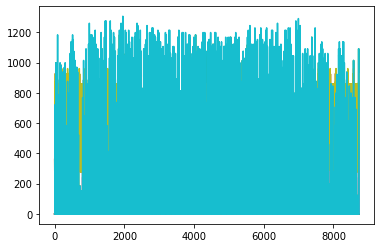

In [13]:
mg_data = mg.get_updated_values()
print(mg_data)

while m_gen.microgrids[0].done == False:
    load = mg_data['load']
    pv = mg_data['pv']
    capa_to_charge = mg_data['capa_to_charge']
    capa_to_dischare = mg_data['capa_to_discharge']
    mg.load
    p_disc = max(0, min(load-pv, capa_to_dischare, mg.battery.p_discharge_max))
    p_char = max(0, min(pv-load, capa_to_charge, mg.battery.p_charge_max))
    if load - pv >=  0:
    
        control_dict = {'battery_charge': 0,
                            'battery_discharge': p_disc,
                            'grid_import': max(0, load-pv-p_disc),
                            'grid_export':0,
                            'pv_consummed': min(pv, load),
                       }
        print (control_dict)
    
    if load - pv <  0:

        control_dict = {'battery_charge': p_char,
                            'battery_discharge': 0,
                            'grid_import': 0,
                            'grid_export': max(0,pv-load-p_char),#abs(min(load-pv,0)),
                            'pv_consummed': min(pv, load+p_char),
                       }
    # you call run passing it your control_dict and it will return the mg_data for the next timestep
    mg_data = mg.run(control_dict)
    print (mg._df_record_actual_production.iloc[-1])
    print ('cost: ', mg.get_cost())
    print ('penalty: ', mg.penalty())
    
print(mg._df_record_actual_production)
plt.plot(mg._df_record_actual_production)
plt.show()


You can use some simple functions to plot wha happened in the microgrid

In [14]:
mg.print_actual_production()

Likewise, you can explore what control decisions have been made

In [15]:
mg.print_control()

And the cost achieved

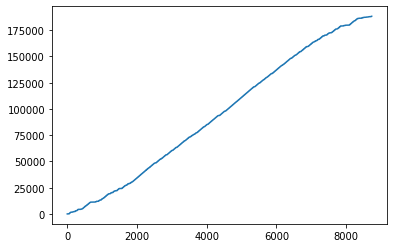

In [19]:
mg.print_cumsum_cost()